# Library

In [2]:
# Ignore the warnings
import warnings
# warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# System related and data input controls
import os

# Python path
import sys
base_folder = 'DataScience'
location_base = os.path.join(os.getcwd().split(base_folder)[0], base_folder)
location_module = [os.path.join(location_base, 'Module')] 
for each in location_module:
    if each not in sys.path:
        sys.path.append(each)

# Auto reload of library
%reload_ext autoreload
%autoreload 2

from import_KK import *
# DeviceStrategy_CPU()
DeviceStrategy_GPU()
from preprocessing_KK import *
from preprocessing_project_KK import *
from description_KK import *
from algorithm_machinelearning_KK import *
from algorithm_deeplearning_KK import *
from evaluation_KK import *
from visualization_KK import *


=========== GPU Strategy ===========
Detected GPUs:
 [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]
TF using MirroredStrategy with 2 GPUs:
 ['/GPU:0', '/GPU:1']


======= GPU / CUDA / STATUS ========
Cuda Ready?        True
CUDA Version:      12.5.1
cuDNN Version:     9

TF Version:        2.19.0
Keras Version:     3.10.0
True
Torch Version:       2.7.1+cu126
Torch CUDA Version:  12.6
Torch cuDNN Version: 90501

Torch GPUs Available: 2
Use the GPU: NVIDIA GeForce RTX 3090



# Hyperparameters

In [3]:
# Data
FOLDER_GDM, FOLDER_GDS = get_google_drivelocation(gdrive='z', glocation=os.path.join('Research', 'SavedData', 'NTIS'))
FOLDER_LOCATION = FOLDER_GDM
# FILENAME = 'koweps_hp01_17_long_230407_KK.csv'
FILENAME = 'koweps_hp01_19_long_250331_KK.csv'
FILE_LOCATION = os.path.join(FOLDER_LOCATION, FILENAME)
YEAR_MIN = 2010
YEAR_MAX = None
AGE_MIN = None
AGE_MAX = None
GENDER = 'all' # 'male', 'female'
LANGUAGE = 'en'

# Preprocessing
Y_colname = 'IPV'
X_reverse = ['p05_aq2', 'p05_15', 'p05_10']
X_nullmax = None
X_nullmin = None
X_dummy = None
X_encoding = None
X_delYrelated = None
X_del = None

TEST_SIZE = 0.2
RANDOM_STATE = 123
CLASS_STAT = True
## 'RandomUnderSampler' <<< 'TomekLinks' << 'CondensedNearestNeighbour' < 'OneSidedSelection'
## 'SMOTE' <<< 'SMOTETomek' << 'BorderlineSMOTE' < 'ADASYN', 'auto'
# SAMPLING_METHOD = 'ADASYN'
SAMPLING_METHOD = 'auto'
## 'minority', 'not majority', 'not minority', 'all', 'auto'
SAMPLING_STRATEGY = 'auto'    # 'minority', 'not majority', 'not minority', 'all', 'auto'
SCALER = 'minmax'
LABEL_LIST = ['Non-Violence', 'Violence']

# Model
## Common
TUNE_TRIALS = 10
CV_SPLITS = 5
## ML
TUNE_METRIC = 'F1-score' # Default('auto'): 'F1-score', 'RMSE' - 접두사 없어도 자동으로 validation set 기준으로 판단TUNE_METRIC = 'auto'
## DL
tf.random.set_seed(123)
NODE_MLP = [128, 256, 128, 64, 32, 10]
NODE_CNN = [32, 64, 128]
VALIDATION_SPLIT = 0.2
if VALIDATION_SPLIT != None:
    VALIDATION_DATA = None
BATCH_SIZE = 64
EPOCHS = 1000
VERBOSE = 0
TUNE_METRIC_DL = 'val_F1-score' # 'AUC', 'Accuracy', 'F1-score', 'loss', 'val_AUC', 'val_Accuracy', 'val_F1-score', 'val_loss'
## Final + XAI
METRIC_FINAL = "F1-score"
SHAP = True
INTERACTION = True
INTERACTION_SAMPLES = 2000
# FEATURE_PERTURBATION = 'tree_path_dependent'    # 'tree_path_dependent', 'interventional'
X_TOP_DISPLAY = 50

# Save
SAVE_NAME_PREDSTATTR = 'DescriptiveStatistics_BinaryPredTrain.csv'
SAVE_NAME_PREDSTATTE = 'DescriptiveStatistics_BinaryPredTest.csv'
SAVE_NAME_ML = 'Performance_ML'
SAVE_NAME_DL = 'Performance_DL'
SAVE_NAME_PERFORMANCE = 'Performance.csv'

# Data Preprocessing

In [10]:
df1 = pd.read_csv(os.path.join(FOLDER_LOCATION, 'SCI(E)논문.csv'))
df2 = pd.read_csv(os.path.join(FOLDER_LOCATION, '공동위탁정보.csv'))
df3 = pd.read_csv(os.path.join(FOLDER_LOCATION, '국내(외)특허.csv'))
df4 = pd.read_csv(os.path.join(FOLDER_LOCATION, '기술료.csv'))
df5 = pd.read_csv(os.path.join(FOLDER_LOCATION, '사업과제정보.csv'))
df6 = pd.read_csv(os.path.join(FOLDER_LOCATION, '사업화.csv'))
df7 = pd.read_csv(os.path.join(FOLDER_LOCATION, '연구개발성과물.csv'))
df8 = pd.read_csv(os.path.join(FOLDER_LOCATION, '연수지원.csv'))
df9 = pd.read_csv(os.path.join(FOLDER_LOCATION, '인력양성.csv'))

In [22]:
df1.columns

Index(['성과발생년도', '성과발생부처', '성과사업ID', '성과사업명', '세부성과관리번호', 'NTIS_성과ID',
       'KISTEP_성과ID', '검증결과', '검증내역', 'SCI여부(입력시)', '학술지명', '논문명', 'ISBN',
       'P-ISSN', 'E-ISSN', '주저자명', '권(volume)', '호(issue)', '시작페이지', '논문번호',
       'DOI/url', '기여율(확정)', '과제수행년도', '과제고유번호', '(기관)세부과제번호', '과제명-국문',
       '출처_파일명'],
      dtype='object')

In [24]:
for col in df1.columns:
    print(df1[col].value_counts())
    print()

성과발생년도
2022          96801
2023          91887
2018          65536
2021          61160
2019          56090
2017          45713
2020          43702
2020          40444
2016          39677
2014          36090
2015          35718
2017          32768
2016          32768
2015          32768
2021          32768
2014          32768
2019          25092
2018          16017
보안과제의 성과정보      508
Name: count, dtype: int64

성과발생부처
교육부          334414
과학기술정보통신부    278442
미래창조과학부       84905
산업통상자원부       35911
보건복지부         28314
농촌진흥청         10941
해양수산부          9537
환경부            7421
농림축산식품부        6435
다부처            4151
국토교통부          4031
방위사업청          2371
산림청            2154
기상청            2051
식품의약품안전처       1717
기획재정부           880
원자력안전위원회        791
질병관리청           664
행정안전부           474
중소벤처기업부         468
문화체육관광부         454
범부처 사업          355
중소기업청           193
경찰청             185
소방청             145
해양경찰청           125
국민안전처            99
행정자치부            71
문화재청             48

In [21]:
df1[['성과발생년도']].value_counts()

성과발생년도    
2022          96801
2023          91887
2018          65536
2021          61160
2019          56090
2017          45713
2020          43702
2020          40444
2016          39677
2014          36090
2015          35718
2014          32768
2015          32768
2021          32768
2017          32768
2016          32768
2019          25092
2018          16017
보안과제의 성과정보      508
Name: count, dtype: int64

In [17]:
df1['논문명'].value_counts()

논문명
Prospects for observing and localizing gravitational-wave transients with Advanced LIGO, Advanced Virgo and KAGRA                          17
Multi-messenger Observations of a Binary Neutron Star Merger                                                                               16
Search for tetraquark states X-ccss in D-s(+) D-s(+) (D-s*(+) D-s*(+)) final states at Belle                                               15
Recent Advances in Triboelectric Nanogenerators: From Technological Progress to Commercial Applications                                    15
The Infrared Medium-deep Survey. IX. Discovery of Two New z similar to 6 Quasars and Space Density Down to M (1450) similar to-23.5 mag    14
                                                                                                                                           ..
Resveratrol sensitizes lung cancer cell to TRAIL by p53 independent and suppression of Akt/NF-kappa B signaling                             1
Ps

In [4]:
# 데이터로딩
# df = get_data_from_koweps19(folder_location=FOLDER_LOCATION, filename=FILENAME)
df = pd.read_csv(FILE_LOCATION, encoding='utf-8-sig')


Preprocessing for Data Prepare...
Initial Shape:  (305227, 2751)
After Year Filtering:  (220400, 2751)
After Age Filtering:  (220400, 2751)

Preprocessing of Y...
Ratio of Origin Y:  IPV
0      87323
1      19978
Name: count, dtype: int64
Shape of Data:  (107301, 2751)

Preprocessing NAN...
Column Deleting...
These  88.10909090909091 %( 2423 ) columns are containing more than  50.0 % null values!: ['h_cobf', 'h01_111', 'h01_5aq1', 'h01_5aq2', 'h01_3aq1', 'h01_5aq3', 'h01_5aq4', 'h_eco3', 'h_eco4_1', 'h_eco5_1', 'h_eco6', 'h_eco_7', 'h_eco_7_1', 'h_eco_7_2', 'h_eco_7_3', 'h_eco11', 'h_soc_3', 'h_soc_4', 'h_soc_5', 'h_soc_6', 'h_soc_7', 'h_soc_8', 'h_soc_9', 'h_soc_10', 'h_soc_11', 'h_inc2_2', 'h_inc3_2', 'h_inc4_2', 'h_inc5_2', 'h_inc6_2', 'h_inc7_2', 'h_inc2', 'h_inc3', 'h_inc4', 'h_inc4_9', 'h_pers_income1', 'h_pers_income2', 'h_pers_income3', 'h_pers_income5', 'h05_2', 'h05_3', 'h05_5', 'h05_6', 'nh05_8', 'nh05_9', 'h06_14aq1', 'h06_3_16aq1', 'h06_3_18aq1', 'h06_9', 'h06_15', 'h06_1

  0%|          | 0/114 [00:00<?, ?it/s]


Shape of Data:  (107301, 325)
Complete of fillna!

Deleting Non-meaning Variables...
Shape of Data:  (107301, 323)

Object X Features:  []
Complete X Object Processing!
0:00:11

Preprocessing for Learning...
Renaming Columns!
(85840, 322) (85840, 1)
(21461, 322) (21461, 1)
Data Split!


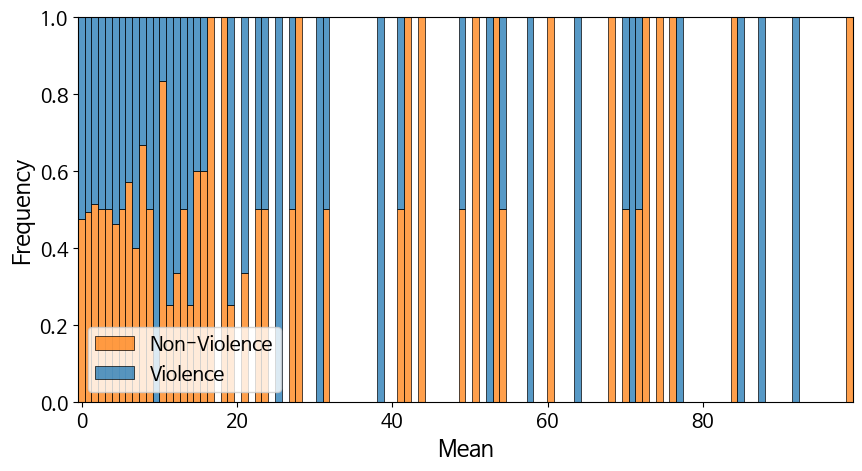

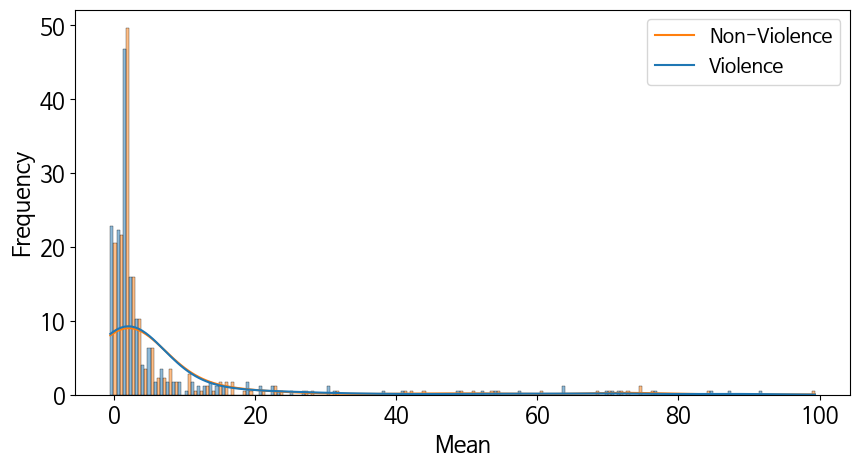

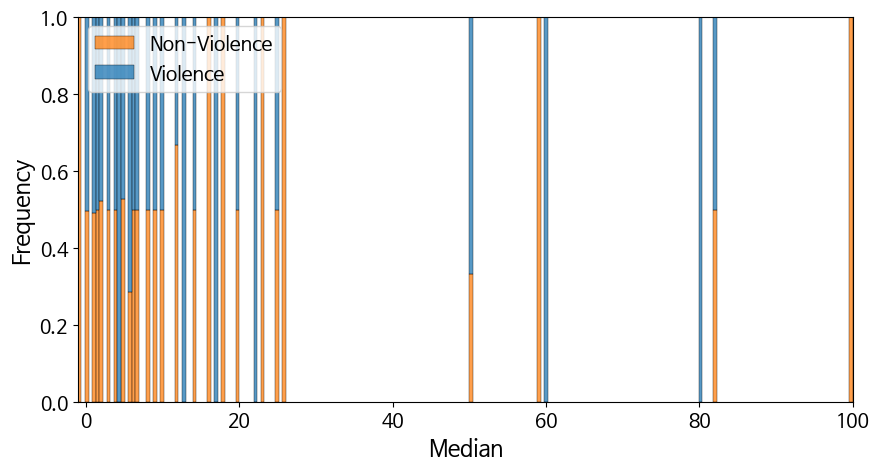

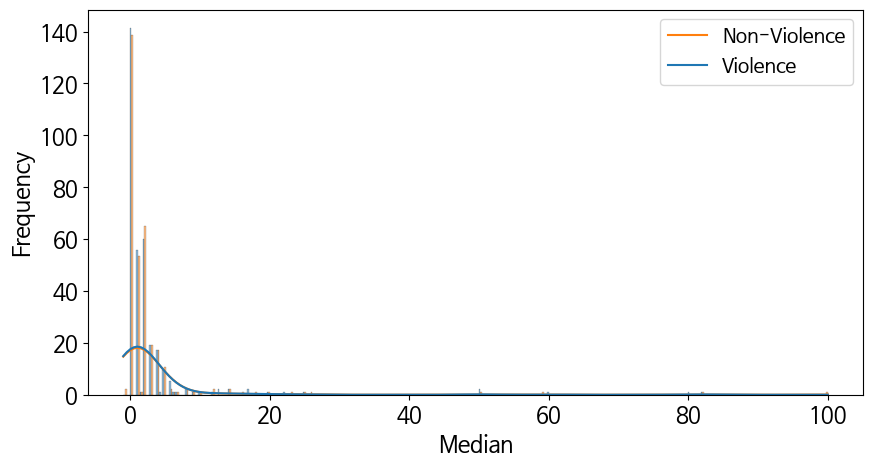

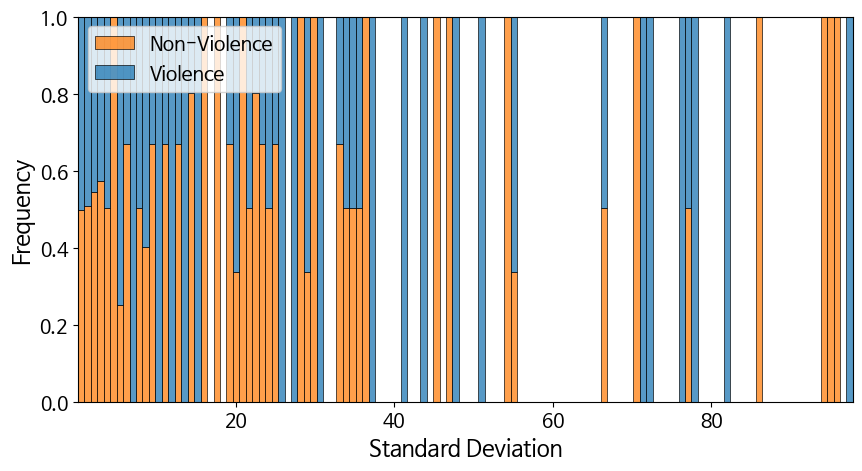

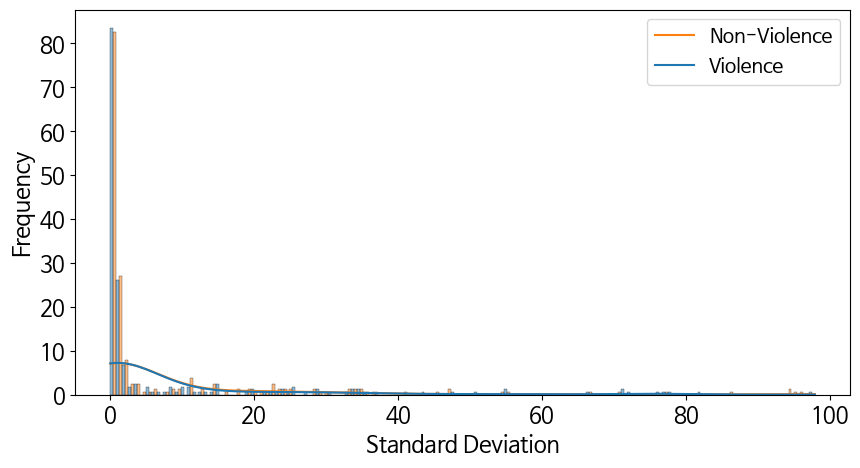

Number of significant features:  310 (0.9627329192546584%)


Non-Violence  \
Frequent disagreements among family members                                                          0.0000     55 (93.22%)   
                                                                                                     1.0000  47872 (91.43%)   
                                                                                                     2.0000  33199 (78.62%)   
                                                                                                     3.0000   4698 (55.96%)   
                                                                                                     4.0000   1418 (35.97%)   
...                                                                                                                     ...   
Fishery worker indicator (yes/no)                                                                    1.0000    112 (76.19%)   
Household group by equivalized income (equivalized current income before public assistance; below... 1.0000  65537 (81.47%)   
                                                                                                     2.0000  21786 (81.13%)   
Received Employment Insurance benefits (yes/no)                                                      1.0000   1747 (81.33%)   
                                                                                                     2.0000  85576 (81.38%)   

                                                                                                                   Violence  \
Frequent disagreements among family members                                                          0.0000       4 (6.78%)   
                                                                                                     1.0000    4486 (8.57%)   
                                                                                                     2.0000   9027 (21.38%)   
                                                                                                     3.0000   3698 (44.04%)   
                                                                                                     4.0000   2524 (64.03%)   
...                                                                                                                     ...   
Fishery worker indicator (yes/no)                                                                    1.0000     35 (23.81%)   
Household group by equivalized income (equivalized current income before public assistance; below... 1.0000  14911 (18.53%)   
                                                                                                     2.0000   5067 (18.87%)   
Received Employment Insurance benefits (yes/no)                                                      1.0000    401 (18.67%)   
                                                                                                     2.0000  19577 (18.62%)   

                                                                                                                              Statistics  
Frequent disagreements among family members                                                          0.0000  $\chi^2$=13319.12, $p$=0.00  
                                                                                                     1.0000                               
                                                                                                     2.0000                               
                                                                                                     3.0000                               
                                                                                                     4.0000                               
...                                                                                                                                  ...  
Fishery worker indicator (yes/no)                                                       

Comparison Statistics of X by Y class!
Undersampling...
(85840, 322) (85840, 1)
Ratio of Origin Y:  IPV
0      69870
1      15970
Name: count, dtype: int64
(31940, 322) (31940, 1)
Ratio of Sampling Y:  IPV
0      15970
1      15970
Name: count, dtype: int64

Preprocessing of Scaling...
(31940, 322) (31940, 1) 0.0 1.0000000000000002
(8016, 322) (8016, 1) -0.014245014245014245 20.408161224489795
Complete!
0:00:38


In [5]:
# 전처리
X_train, X_test, Y_train, Y_test, df_prep, X_colname = preprocessing_koweps(
    df, 
    year_min=YEAR_MIN, year_max=YEAR_MAX,
    age_min=AGE_MIN, age_max=AGE_MAX, gender=GENDER,
    Y_colname=Y_colname, X_reverse=X_reverse,
    test_size=TEST_SIZE,
    class_stat=CLASS_STAT, 
    sampling_method=SAMPLING_METHOD,
    sampling_strategy=SAMPLING_STRATEGY,
    scaler=SCALER,
    label_list=LABEL_LIST,
    language=LANGUAGE,
)

# Modeling

## Machine Learning

In [6]:
# # Setting
# algorithm_list = ['Logistic Regression', 'Random Forest', 'XGBoost', 'LightGBM', 'CatBoost']
# TUNE_TRIALS = None
# # TUNE_TRIALS = 10

# # ML 실행
# results_ML, scores_ML = modeling_ML(
#     algos=algorithm_list,
#     X_train=X_train, Y_train=Y_train, X_test=X_test, Y_test=Y_test,
#     X_colname=X_colname,
#     params=None, # 특정 알고리즘
#     tune_trials=TUNE_TRIALS, # 최적화 여부
#     cv_splits=CV_SPLITS,
#     tune_metric=TUNE_METRIC,
#     shap=not SHAP, 
#     X_selected=None, # shap에서만 작동
#     interaction=not INTERACTION,
#     interaction_samples=INTERACTION_SAMPLES, 
#     X_top_display=X_TOP_DISPLAY, 
#     label_list=LABEL_LIST,
# )

▶ Detected Task Type: [ classification ] (Target: binary)

   Running Machine Learning Algorithm: LightGBM (classification)
Learning...:  2026-01-26 14:33:26.830956


  0%|          | 0/10 [00:00<?, ?it/s]

[LightGBM] Best Optuna Score (F1-score):  0.7744178928191133
[LightGBM] Best Tuning Parameters:  {'n_estimators': 600, 'learning_rate': 0.06897432280123067, 'num_leaves': 179, 'max_depth': 15, 'min_child_samples': 10, 'subsample': 0.7146771684056821, 'colsample_bytree': 0.5559371889169205, 'min_split_gain': 0.6344075449580774, 'extra_trees': False, 'reg_alpha': 7.93287700013735e-07, 'reg_lambda': 2.046801903762416e-05, 'random_state': 123, 'n_jobs': -1, 'verbose': -1, 'class_weight': None}

Explanations...:  2026-01-26 14:39:58.579967
Explanations of Y:


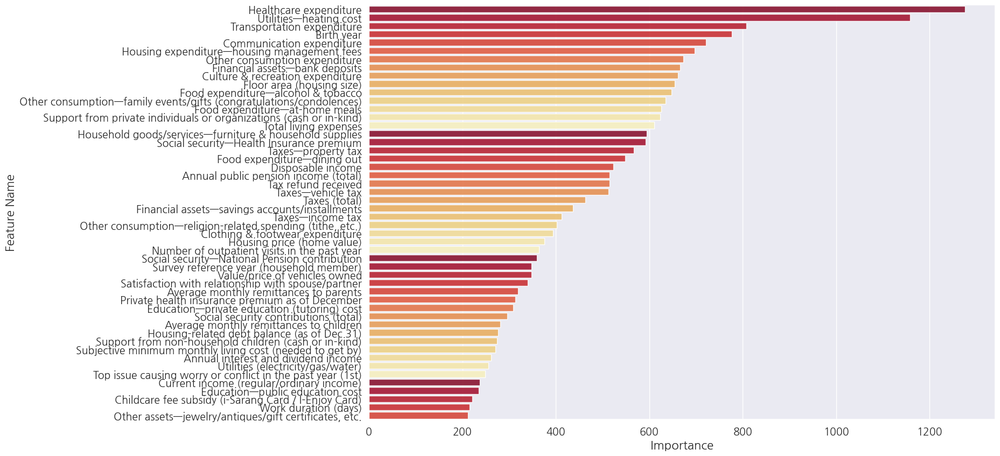

Performance Evaluations...:  2026-01-26 14:39:59.125816
Performance: 


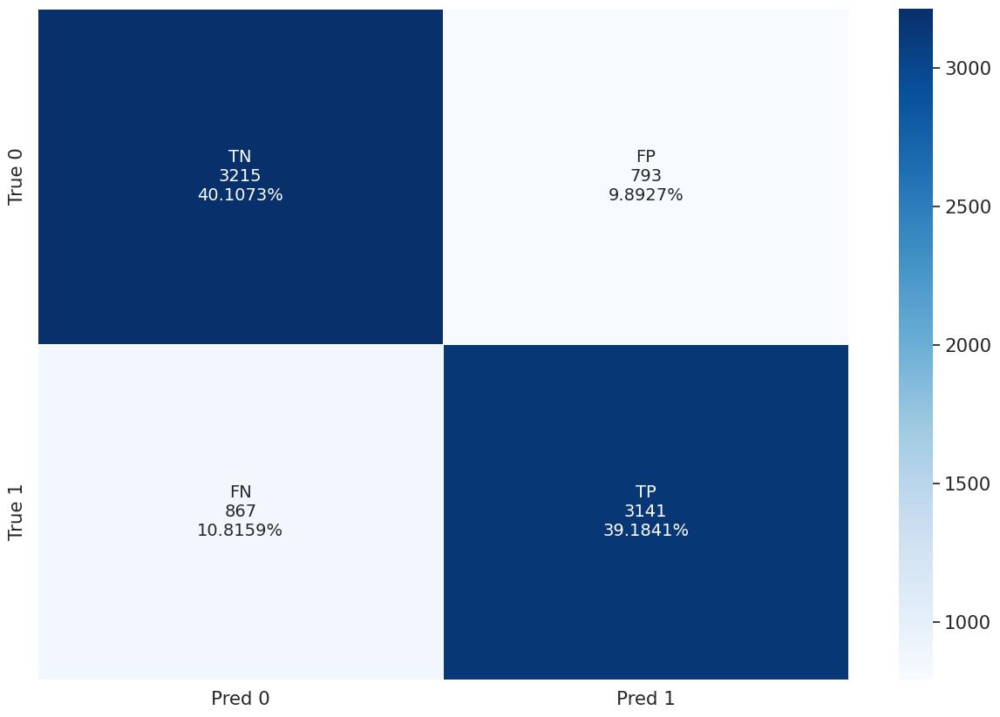

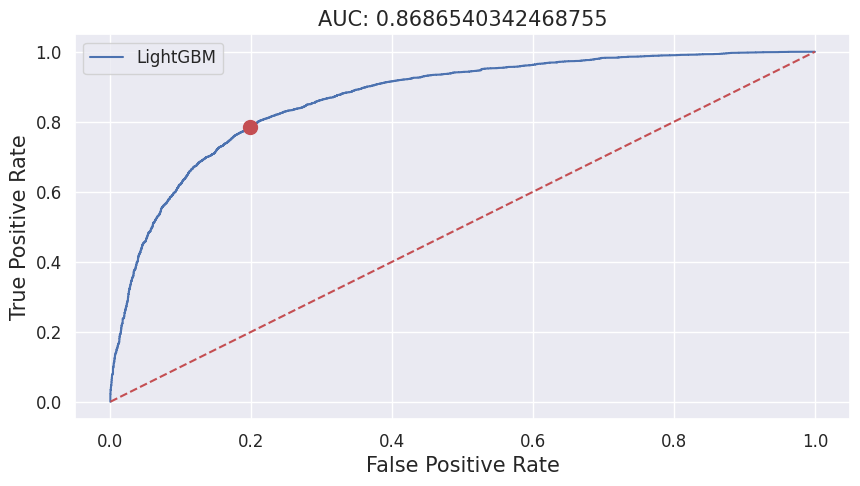

,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,LightGBM,Train set,31940,15744,15833,137,226,0.9914,0.9858,0.9914,0.9886,0.9886,0.9886,0.9993
1,LightGBM,Validation(CV),31940,12391,12383,3587,3579,0.7758,0.7731,0.7766,0.7744,0.7748,0.7748,0.8544
2,LightGBM,Test set,8016,3141,3215,793,867,0.7984,0.7837,0.8021,0.7910,0.7929,0.7929,0.8687
3,LightGBM,Entire population,39956,18885,19048,930,1093,0.9531,0.9453,0.9534,0.9492,0.9494,0.9494,0.9824


   [Save] LightGBM Checkpoint Saved:
     - Model : /mnt/c/DataScience/Publication/Easygoing_Enter/Paper 3_IPV Prediction/Model/best_model_LightGBM_20260126_144011.pkl
     - Params: /mnt/c/DataScience/Publication/Easygoing_Enter/Paper 3_IPV Prediction/Model/best_params_LightGBM_20260126_144011.json

   Running Machine Learning Algorithm: CatBoost (classification)
Learning...:  2026-01-26 14:40:11.446890


  0%|          | 0/10 [00:00<?, ?it/s]

[CatBoost] Best Optuna Score (F1-score):  0.7711357566844829
[CatBoost] Best Tuning Parameters:  {'iterations': 450, 'depth': 7, 'learning_rate': 0.07145573850687863, 'l2_leaf_reg': 7.040667779596383, 'subsample': 0.9033004948588075, 'grow_policy': 'Depthwise', 'random_state': 123, 'verbose': 0, 'allow_writing_files': False}

Explanations...:  2026-01-26 14:48:11.645313
Explanations of Y:


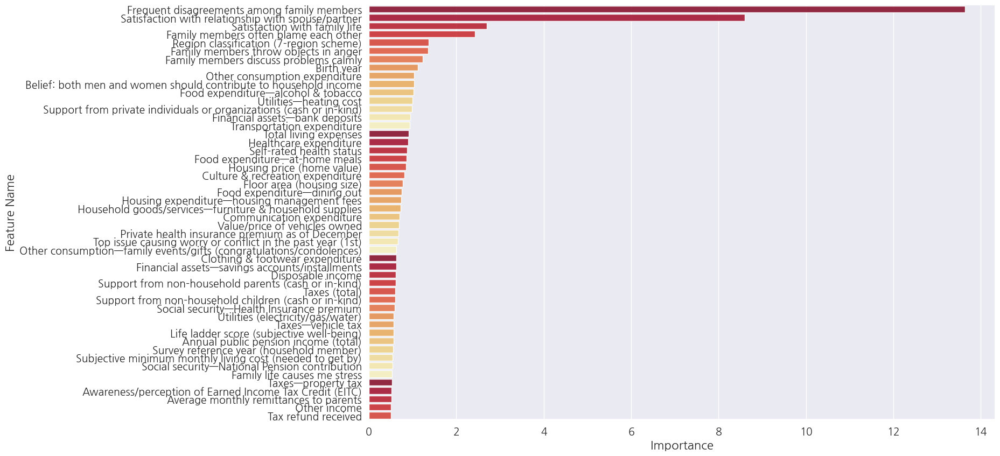

Performance Evaluations...:  2026-01-26 14:48:12.197746
Performance: 


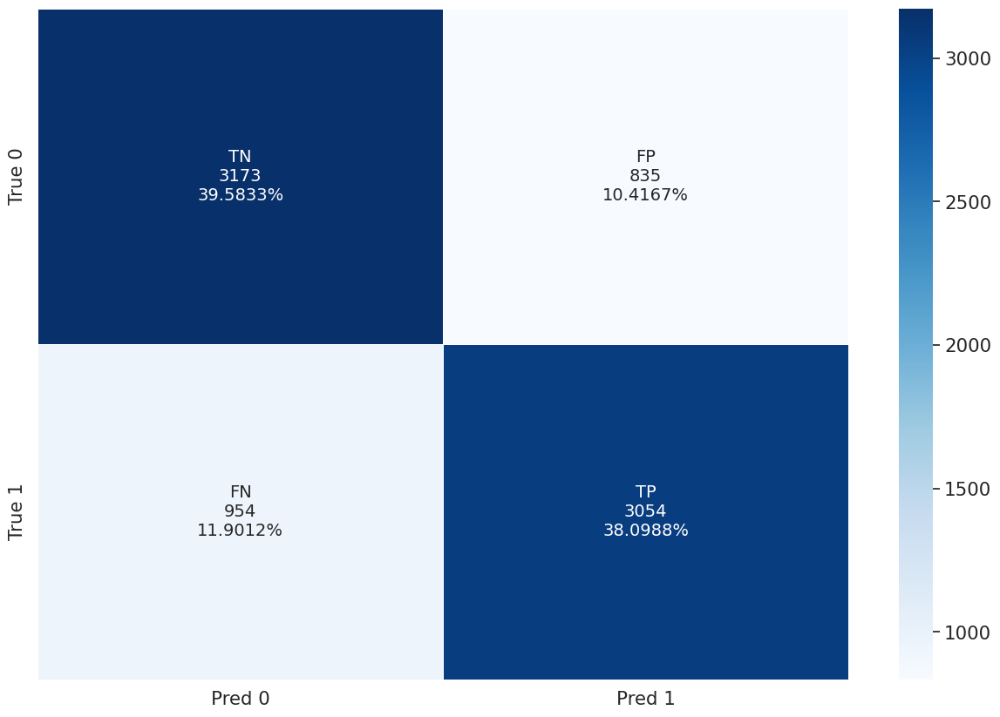

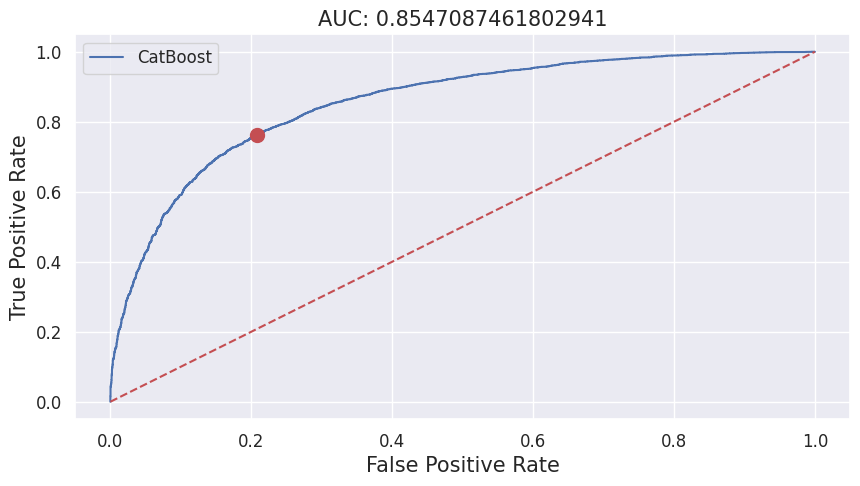

,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,CatBoost,Train set,31940,14747,14876,1094,1223,0.9309,0.9234,0.9315,0.9272,0.9275,0.9275,0.9799
1,CatBoost,Validation(CV),31940,12163,12309,3661,3807,0.7736,0.7687,0.7751,0.7711,0.7719,0.7719,0.8506
2,CatBoost,Test set,8016,3054,3173,835,954,0.7853,0.7620,0.7917,0.7735,0.7768,0.7768,0.8547
3,CatBoost,Entire population,39956,17801,18049,1929,2177,0.9022,0.8910,0.9034,0.8966,0.8972,0.8972,0.9587


   [Save] CatBoost Checkpoint Saved:
     - Model : /mnt/c/DataScience/Publication/Easygoing_Enter/Paper 3_IPV Prediction/Model/best_model_CatBoost_20260126_144853.pkl
     - Params: /mnt/c/DataScience/Publication/Easygoing_Enter/Paper 3_IPV Prediction/Model/best_params_CatBoost_20260126_144853.json

   Modeling Completed. Summary of Performance (classification)


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,LightGBM,Train set,31940,15744,15833,137,226,0.991373,0.985848,0.991421,0.988603,0.988635,0.988635,0.999278
4,CatBoost,Train set,31940,14747,14876,1094,1223,0.930939,0.923419,0.931497,0.927164,0.927458,0.927458,0.979912


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
1,LightGBM,Validation(CV),31940,12391,12383,3587,3579,0.775791,0.773075,0.776581,0.774418,0.774828,0.774828,0.854438
5,CatBoost,Validation(CV),31940,12163,12309,3661,3807,0.773612,0.768691,0.775078,0.771136,0.771885,0.771885,0.850602


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
2,LightGBM,Test set,8016,3141,3215,793,867,0.798424,0.783683,0.802146,0.790985,0.792914,0.792914,0.868654
6,CatBoost,Test set,8016,3054,3173,835,954,0.785292,0.761976,0.791667,0.773458,0.776821,0.776821,0.854709


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
3,LightGBM,Entire population,39956,18885,19048,930,1093,0.953066,0.945290,0.953449,0.949162,0.949369,0.949369,0.982381
7,CatBoost,Entire population,39956,17801,18049,1929,2177,0.902230,0.891030,0.903444,0.896595,0.897237,0.897237,0.958653


test
Saved total performance to: /mnt/c/DataScience/Publication/Easygoing_Enter/Paper 3_IPV Prediction/Result/Performance_ML(Trial10).csv
Saved total parameters to: /mnt/c/DataScience/Publication/Easygoing_Enter/Paper 3_IPV Prediction/Result/Hyperparams_ML(Trial10).csv
Saved total results object to: /mnt/c/DataScience/Publication/Easygoing_Enter/Paper 3_IPV Prediction/Model/Best_Result_ML(Trial10).pkl


In [13]:
# Setting
algorithm_list = ['Logistic Regression', 'Random Forest', 'XGBoost', 'LightGBM', 'CatBoost']
# TUNE_TRIALS = None
TUNE_TRIALS = 10

# ML 실행
results_ML, scores_ML = modeling_ML(
    algos=algorithm_list,
    X_train=X_train, Y_train=Y_train, X_test=X_test, Y_test=Y_test,
    X_colname=X_colname,
    params=None, # 특정 알고리즘
    tune_trials=TUNE_TRIALS, # 최적화 여부
    cv_splits=CV_SPLITS,
    tune_metric=TUNE_METRIC,
    shap=not SHAP, 
    X_selected=None, # shap에서만 작동
    interaction=not INTERACTION,
    interaction_samples=INTERACTION_SAMPLES, 
    X_top_display=X_TOP_DISPLAY, 
    label_list=LABEL_LIST,
)

## Deep Learning

In [ ]:
# # Setting
# algorithm_list = ['MLP', 'CNN']
# TUNE_TRIALS = None
# # TUNE_TRIALS = 10

# # DL 실행
# results_DL, scores_DL = modeling_DL(
#     algos=algorithm_list,
#     X_train=X_train, Y_train=Y_train, X_test=X_test, Y_test=Y_test,
#     node_list=None, # 특정 알고리즘
#     validation_split=VALIDATION_SPLIT,
#     validation_data=VALIDATION_DATA,
#     tune_trials=TUNE_TRIALS, # 최적화 여부
#     tune_metric=TUNE_METRIC_DL,
#     epochs=EPOCHS-500,
#     batch_size=BATCH_SIZE,
#     earlystop_patient=None,
#     shap_display=False,
#     label_list=LABEL_LIST,
#     random_state=RANDOM_STATE,
# )

▶ Detected Task Type: [ classification ] (Target: binary)

   Running Deep Learning Algorithm: MLP (classification)
[Info] Starting Hyperparameter Optimization (Trials: 10)...


  0%|          | 0/10 [00:00<?, ?it/s]

Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

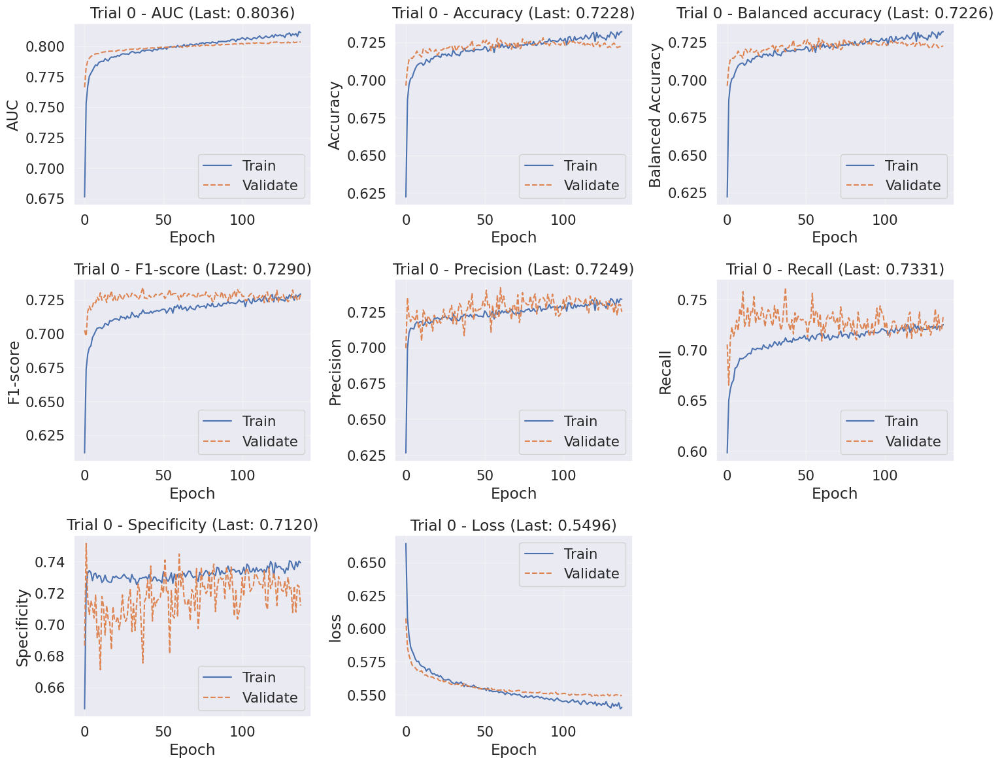

Training Progress:  14%|████████▍                                                    | 138/1000 [05:28<34:14,  2.38s/it]


200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

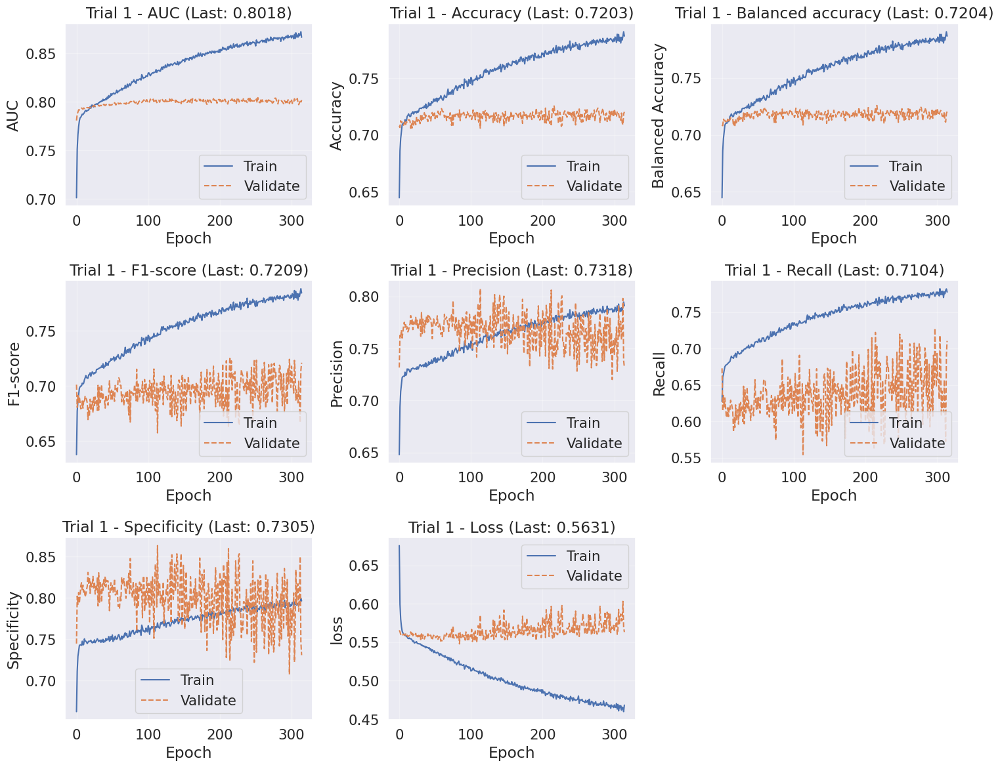

Training Progress:  32%|███████████████████▏                                         | 315/1000 [19:30<42:26,  3.72s/it]


200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

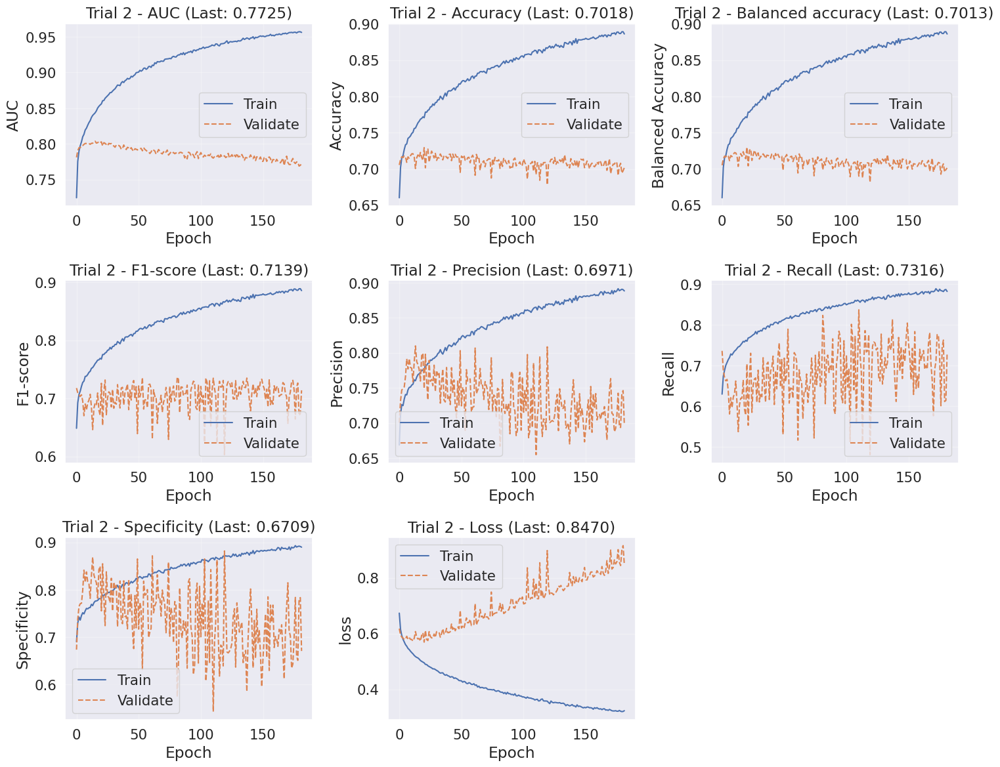

Training Progress:  18%|███████████                                                  | 182/1000 [07:49<35:11,  2.58s/it]


200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

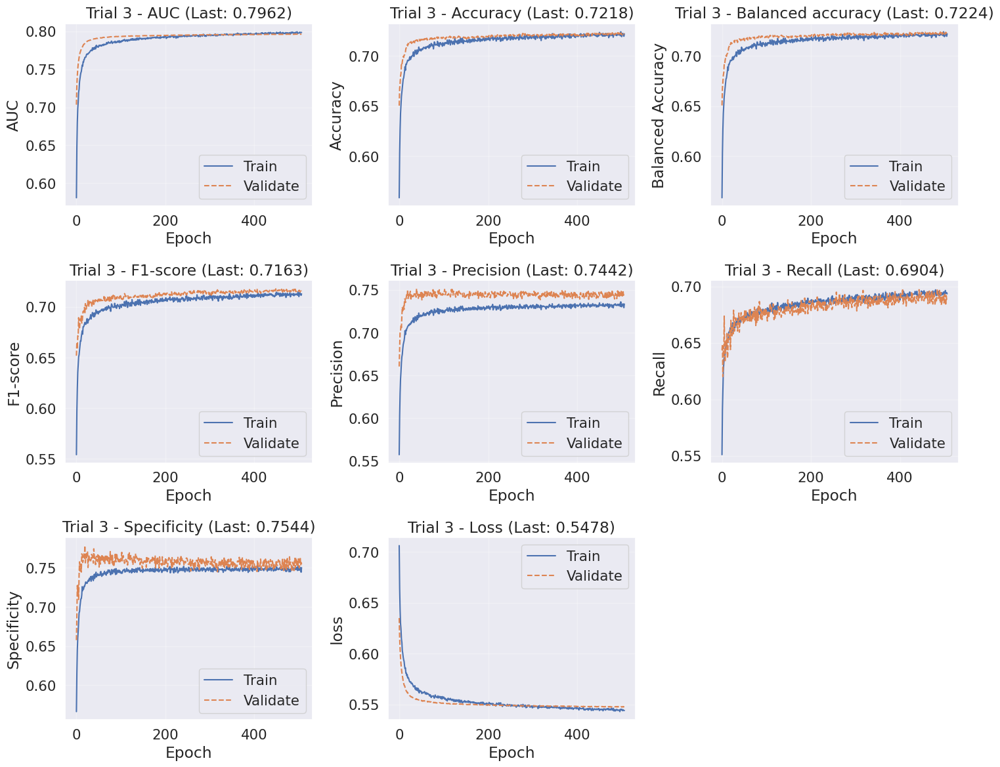

Training Progress:  51%|██████████████████████████████▉                              | 507/1000 [16:48<16:20,  1.99s/it]

  1/200 ━━━━━━━━━━━━━━━━━━━━ 27s 140ms/step

200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

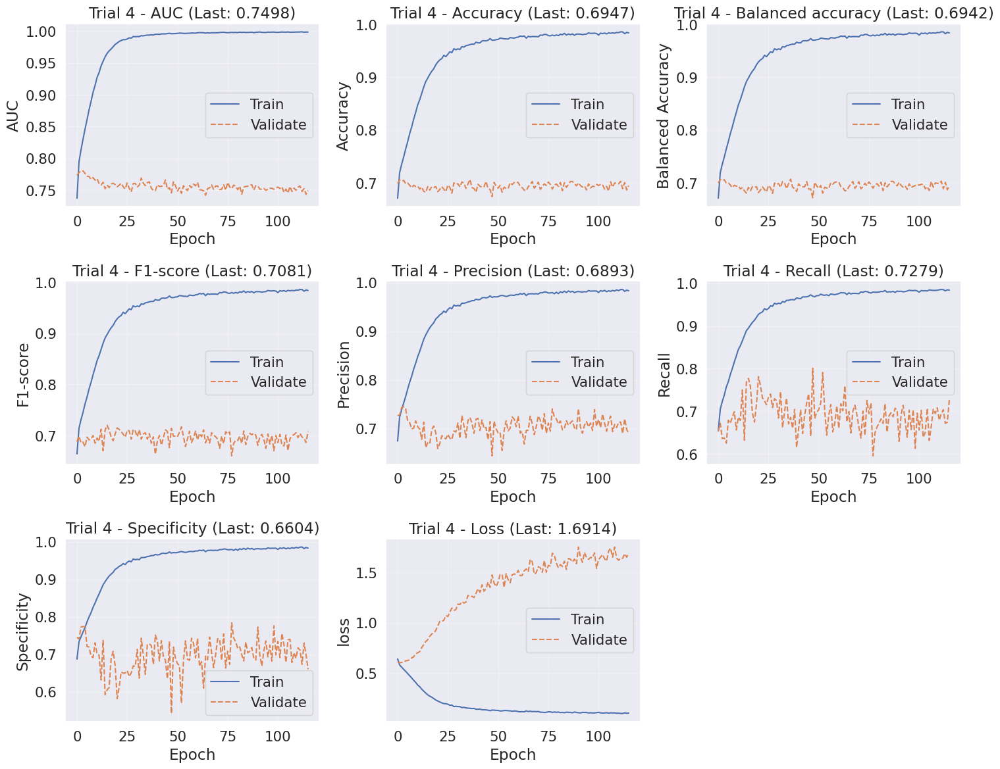

Training Progress:  12%|███████                                                      | 116/1000 [07:39<58:20,  3.96s/it]


200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

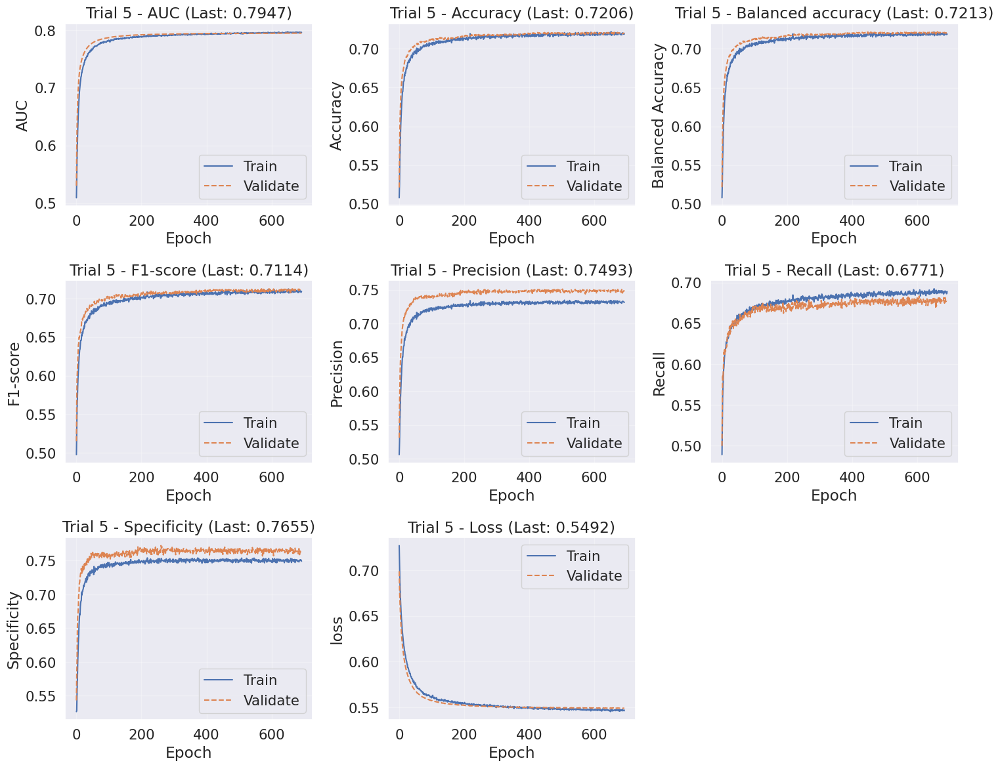

Training Progress:  69%|██████████████████████████████████████████▎                  | 693/1000 [28:00<12:24,  2.42s/it]

  1/200 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step

200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

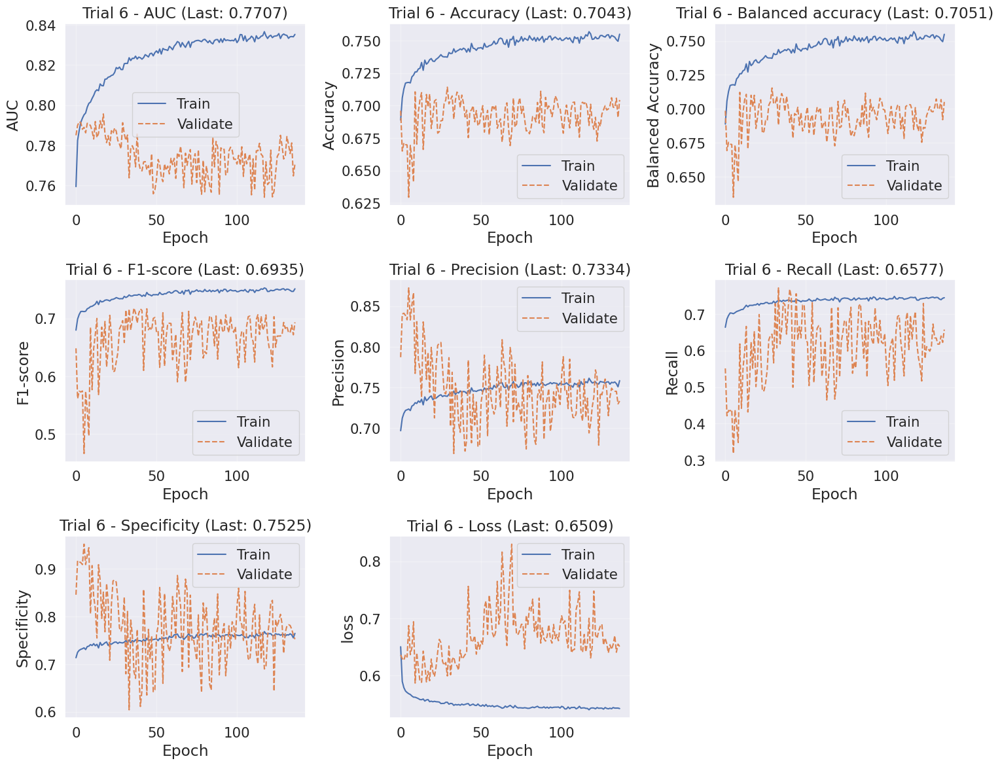

Training Progress:  14%|████████▎                                                    | 137/1000 [04:29<28:20,  1.97s/it]


200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

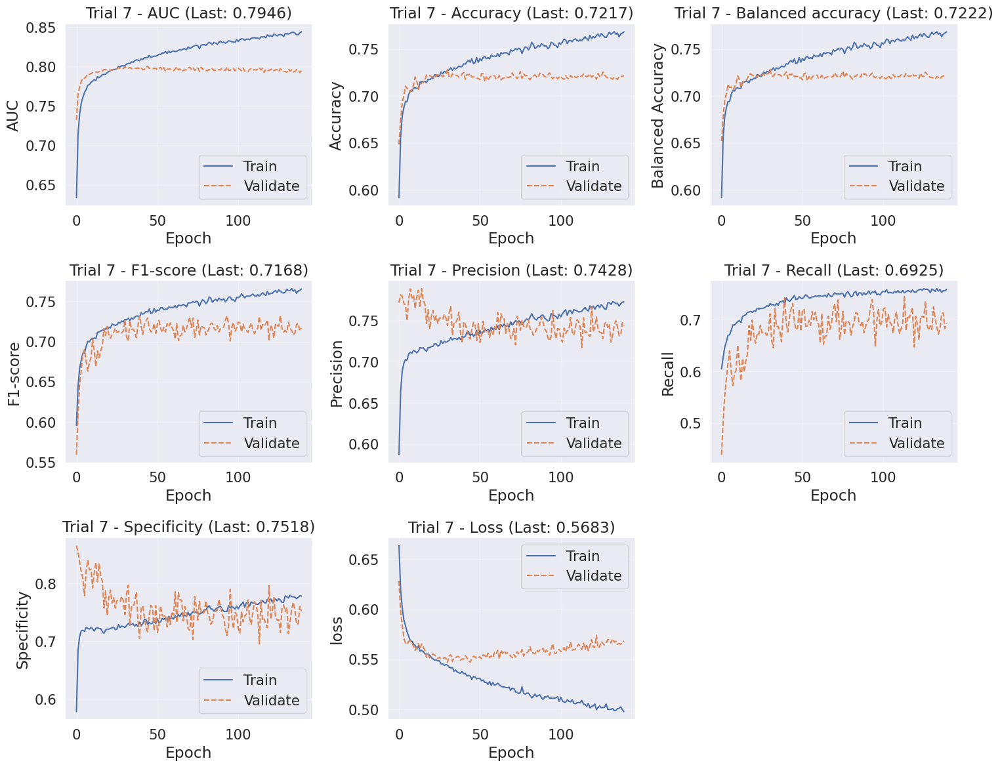

Training Progress:  14%|████████▌                                                    | 140/1000 [05:53<36:13,  2.53s/it]


200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

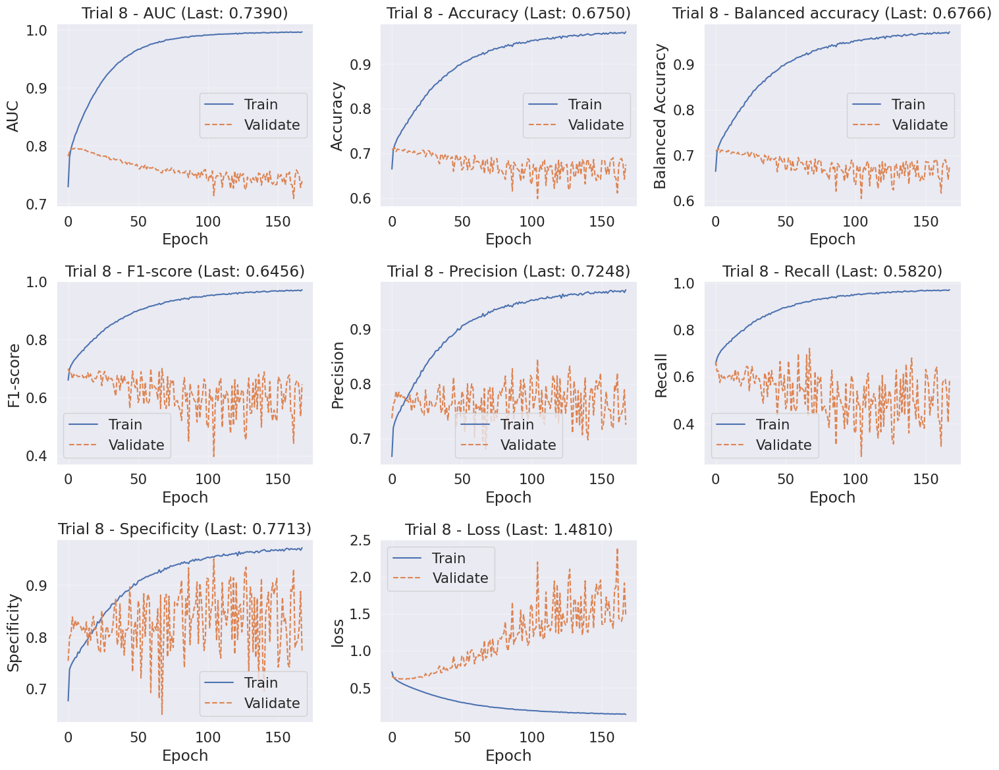

Training Progress:  17%|██████████▏                                                  | 168/1000 [10:09<50:18,  3.63s/it]


200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

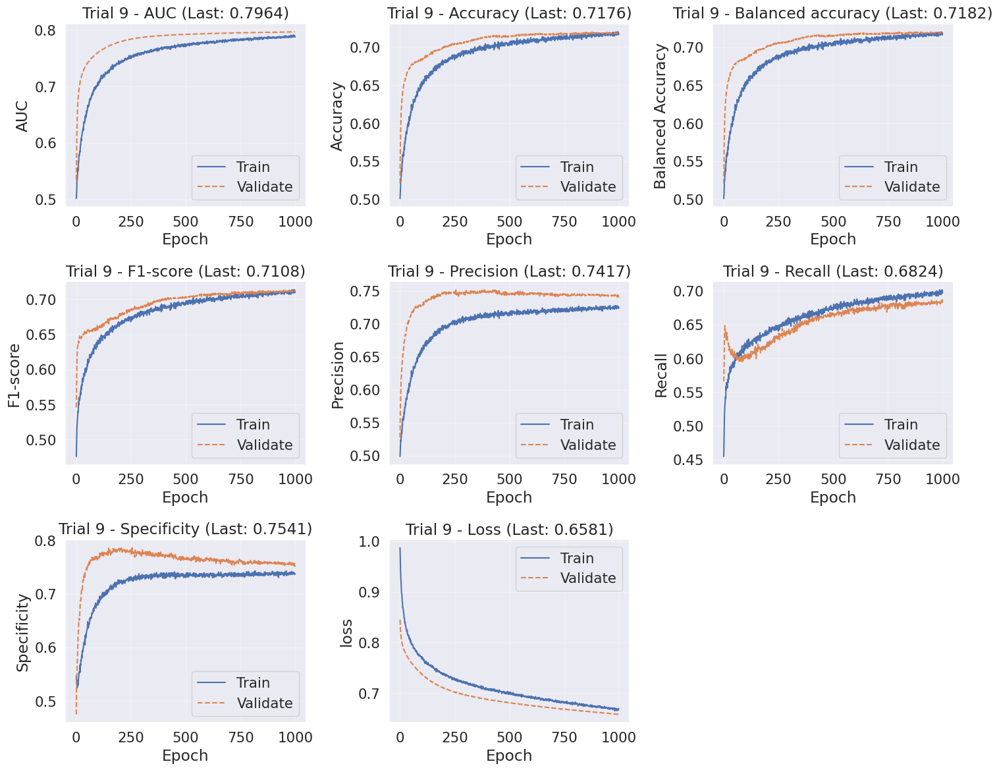

Training Progress: 100%|██████████████████████████████████████████████████████████| 1000/1000 [1:07:53<00:00,  4.07s/it]


200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Trial:  0 State:  1 Best Epoch:  37
Metrics:  {'AUC': 0.7968246936798096, 'Accuracy': 0.7209611535072327, 'Balanced Accuracy': 0.7209229469299316, 'F1-score': 0.7175789966710228, 'Precision': 0.7231935858726501, 'Recall': 0.7120509147644043, 'Specificity': 0.7297950387001038, 'loss': 0.556222140789032, 'val_AUC': 0.7980343103408813, 'val_Accuracy': 0.7193174958229065, 'val_Balanced Accuracy': 0.7185735970251346, 'val_F1-score': 0.7340946096576189, 'val_Precision': 0.7083571553230286, 'val_Recall': 0.761772871017456, 'val_Specificity': 0.675374323032813, 'val_loss': 0.5589127540588379, 'val_N': 6388.0, 'val_True Positive': 2475.0, 'val_True Negative': 2120.0, 'val_False Positive': 1019.0, 'val_False Negative': 774.0}

Trial:  1 State:  1 Best Epoch:  214
Metrics:  {'AUC': 0.8557769060134888, 'Accuracy': 0.7741468548774719, 'Balanced Accuracy': 0.7740960121154785, 'F1-score': 0.7706735563544298, 'Precision': 0.7792510390281677, 'Recall': 0.7622828

Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

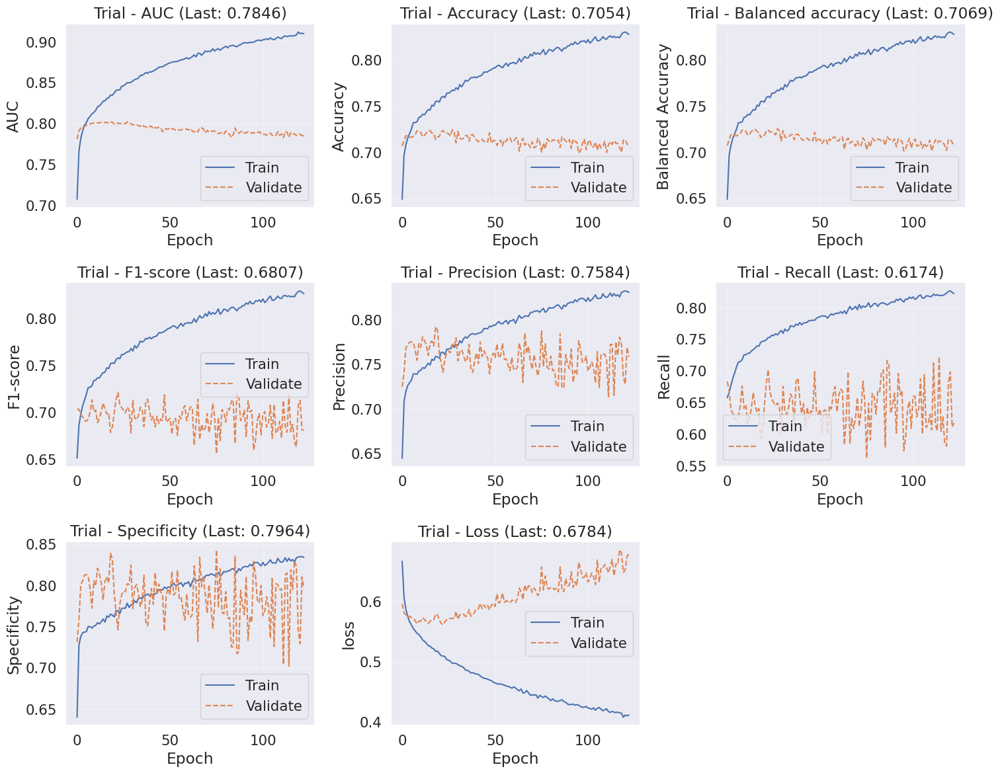

Training Progress:  12%|███████▌                                                     | 123/1000 [05:07<36:35,  2.50s/it]


   [Save] MLP Checkpoint Saved:
     - Model : /mnt/c/DataScience/Publication/Easygoing_Enter/Paper 3_IPV Prediction/Model/best_model_MLP_20260125_043418.keras
     - Params: /mnt/c/DataScience/Publication/Easygoing_Enter/Paper 3_IPV Prediction/Model/best_params_MLP_20260125_043418.json
999/999 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Performance: 


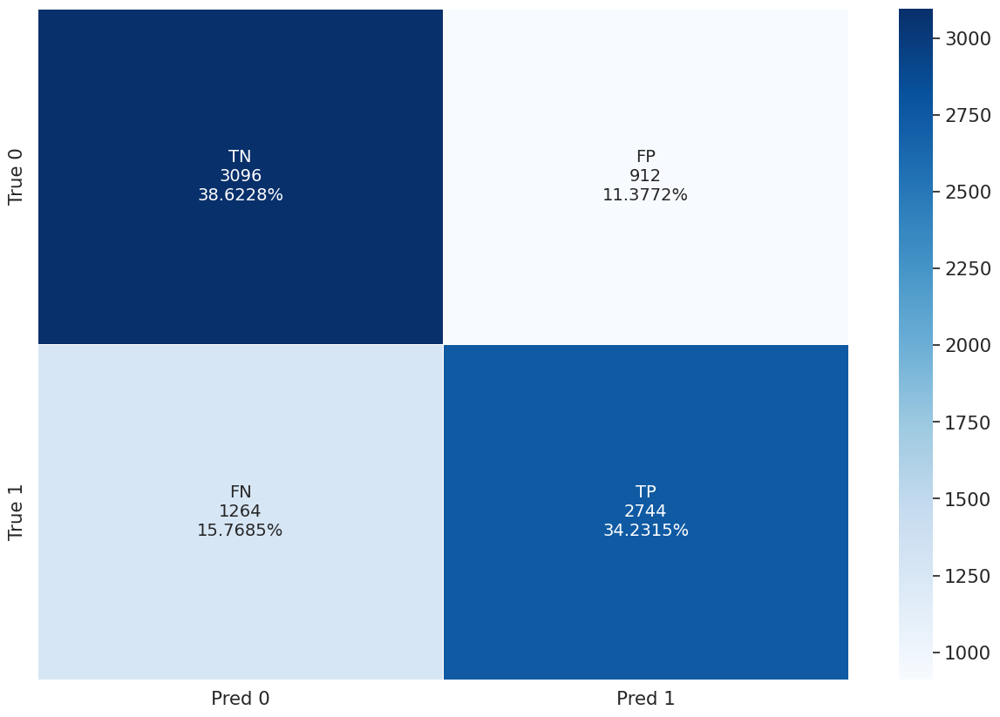

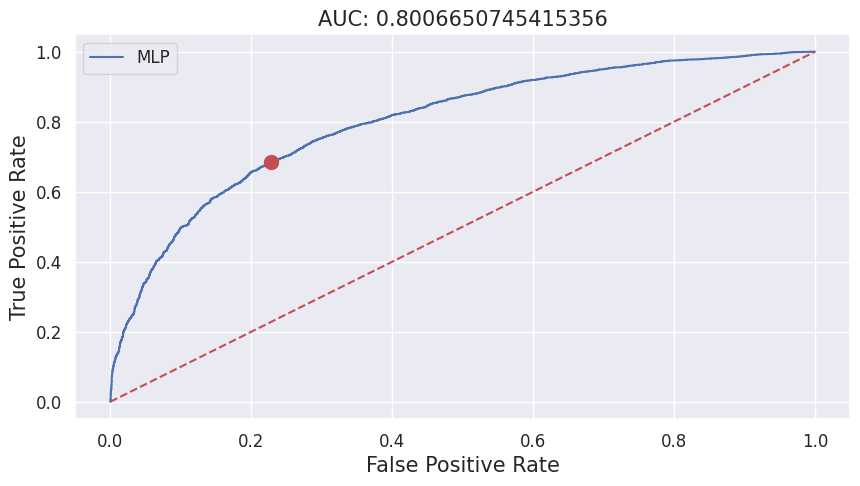

200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

   Running Deep Learning Algorithm: CNN (classification)
[Info] Starting Hyperparameter Optimization (Trials: 10)...


  0%|          | 0/10 [00:00<?, ?it/s]

Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

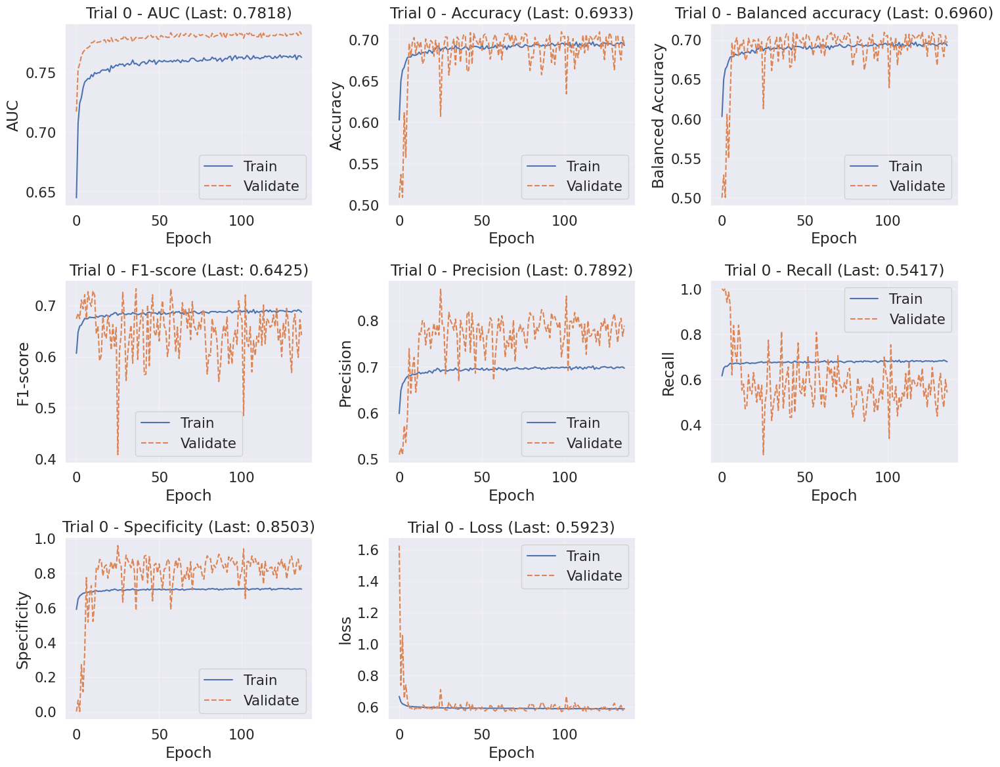

Training Progress:  14%|████████▎                                                    | 137/1000 [07:09<45:03,  3.13s/it]


200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

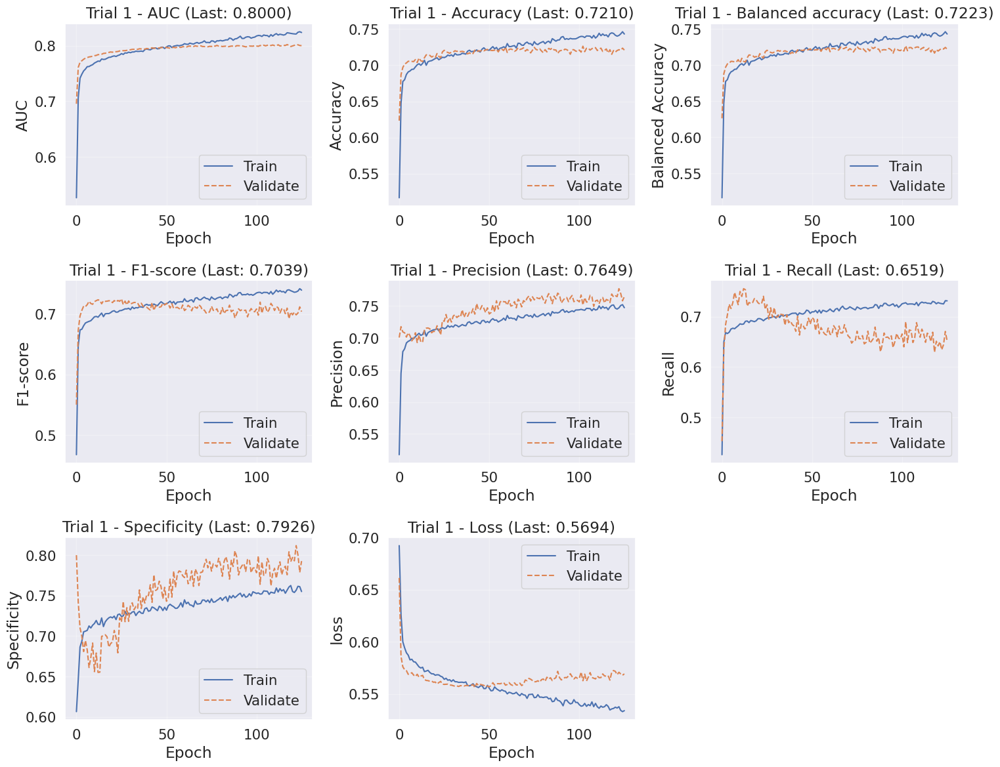

Training Progress:  13%|███████▋                                                     | 126/1000 [06:27<44:50,  3.08s/it]


200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

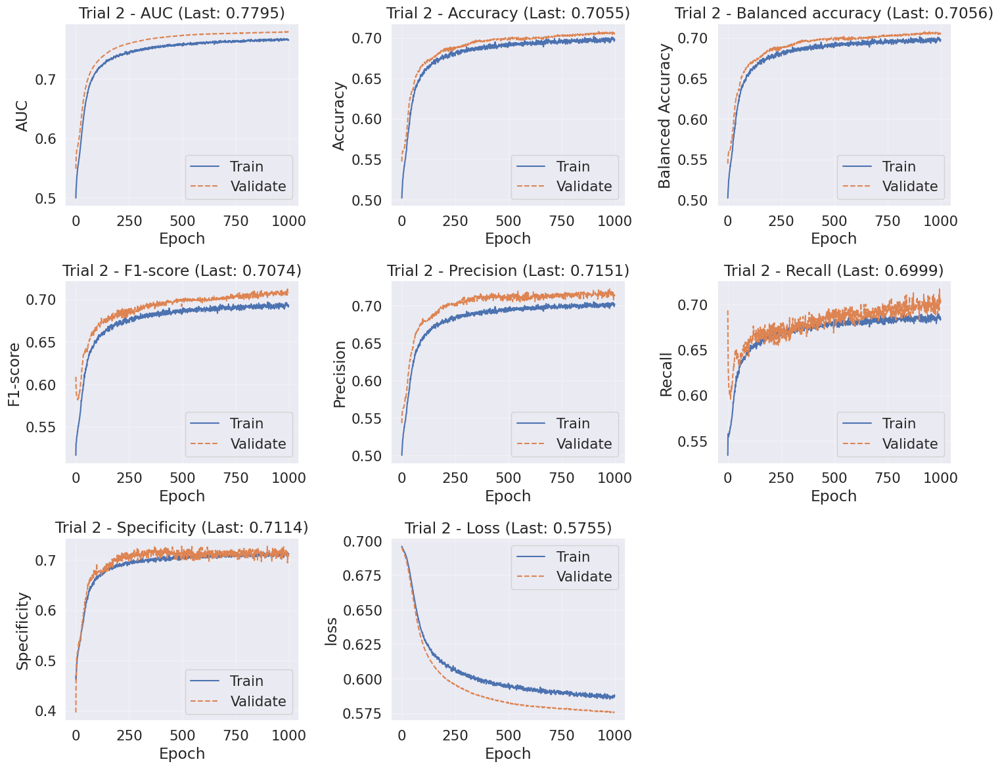

Training Progress: 100%|████████████████████████████████████████████████████████████| 1000/1000 [35:32<00:00,  2.13s/it]


200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

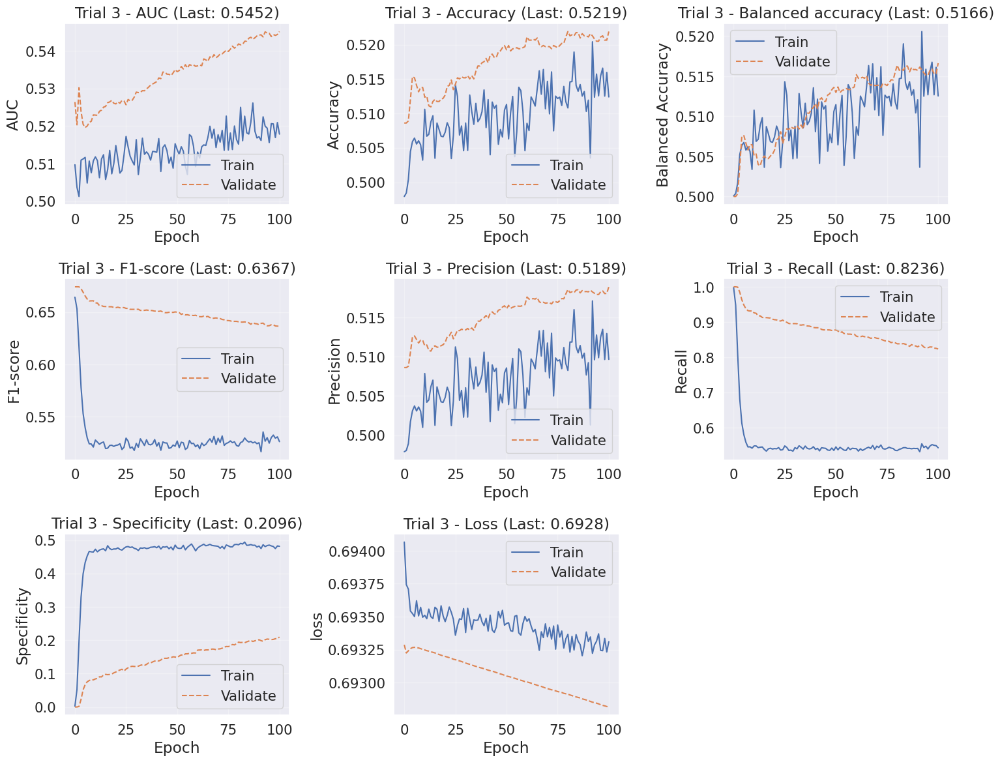

Training Progress:  10%|██████▏                                                      | 101/1000 [03:46<33:36,  2.24s/it]


200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

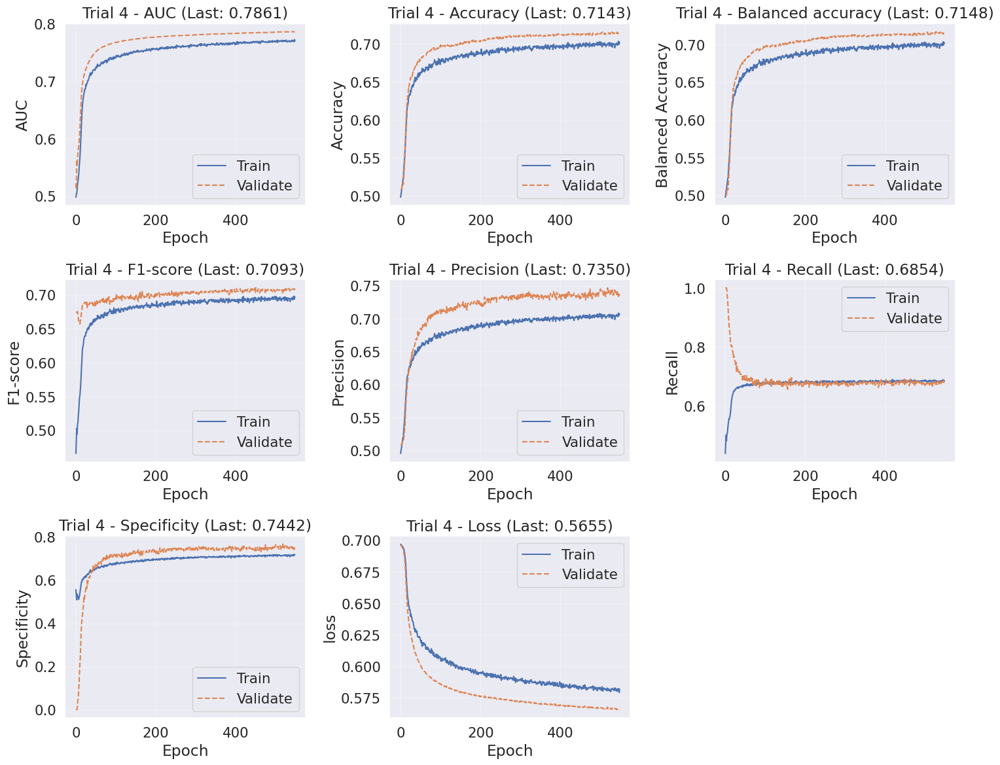

Training Progress:  55%|█████████████████████████████████▍                           | 549/1000 [19:17<15:50,  2.11s/it]


200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

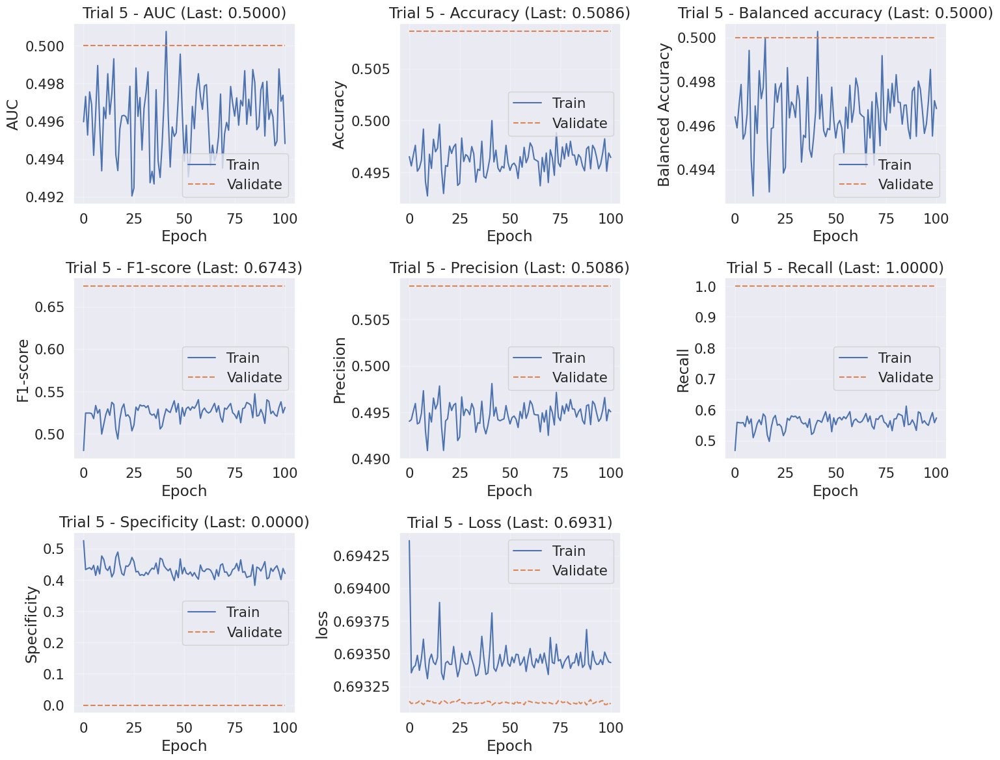

Training Progress:  10%|█████▉                                                     | 101/1000 [07:58<1:10:56,  4.73s/it]


200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

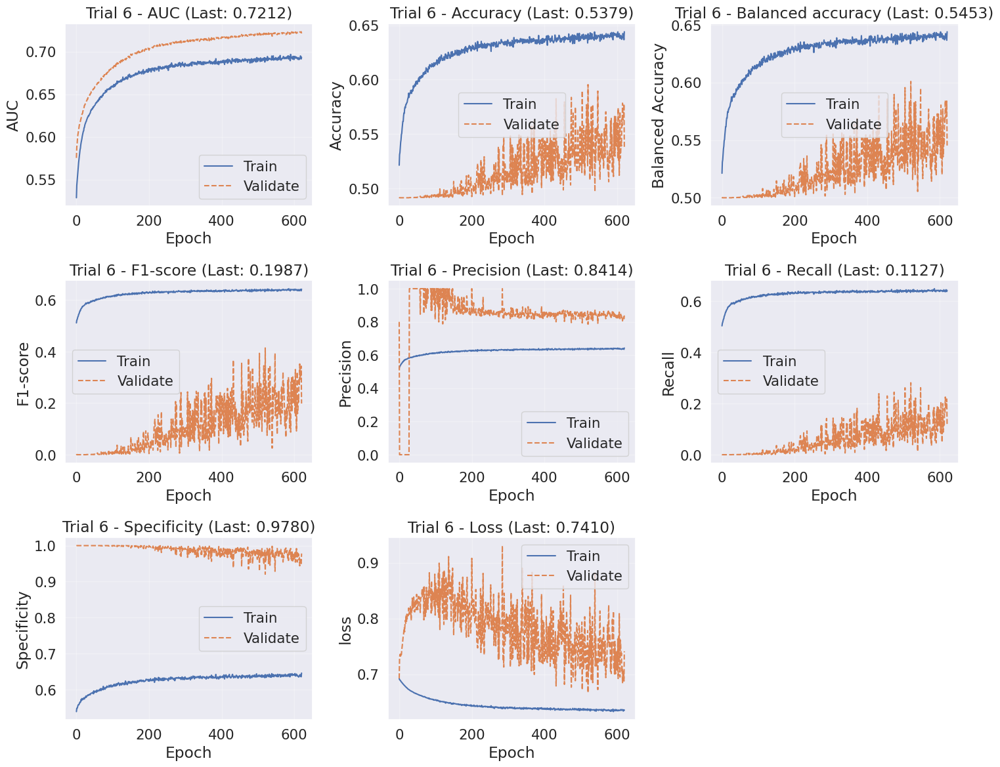

Training Progress:  62%|█████████████████████████████████████▉                       | 621/1000 [29:31<18:01,  2.85s/it]


200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

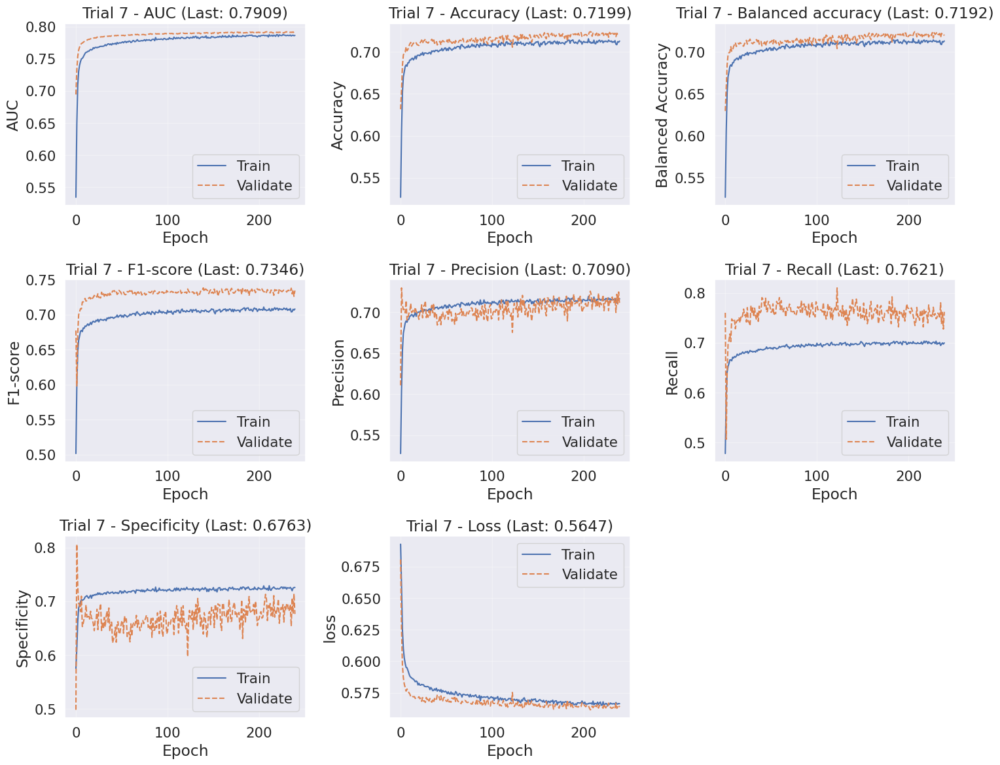

Training Progress:  24%|██████████████▋                                              | 240/1000 [11:15<35:37,  2.81s/it]


200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

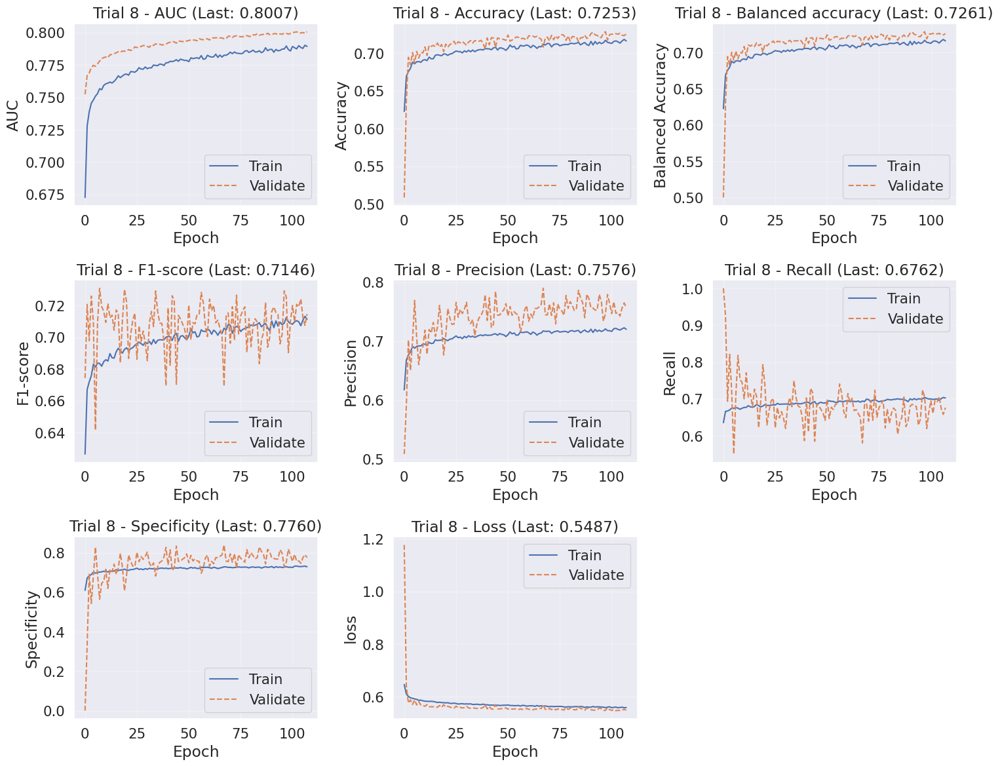

Training Progress:  11%|██████▌                                                      | 108/1000 [05:28<45:11,  3.04s/it]


200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

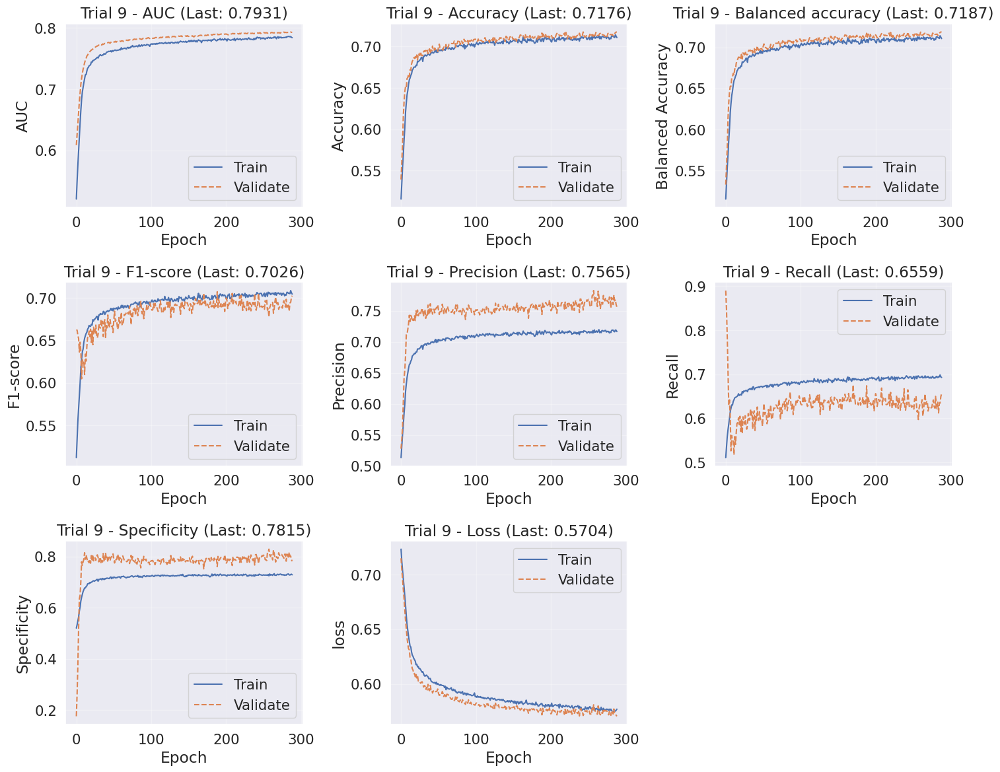

Training Progress:  29%|█████████████████▋                                           | 289/1000 [14:08<34:46,  2.93s/it]


200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Trial:  0 State:  1 Best Epoch:  36
Metrics:  {'AUC': 0.7576205730438232, 'Accuracy': 0.6894568204879761, 'Balanced Accuracy': 0.6893929243087769, 'F1-score': 0.6838267491847914, 'Precision': 0.6933581233024597, 'Recall': 0.6745538711547852, 'Specificity': 0.7042319178581238, 'loss': 0.5921642184257507, 'val_AUC': 0.779452383518219, 'val_Accuracy': 0.6994364261627197, 'val_Balanced Accuracy': 0.6974813480804816, 'val_F1-score': 0.7329624292782864, 'val_Precision': 0.668612003326416, 'val_Recall': 0.8110187649726868, 'val_Specificity': 0.5839439311882765, 'val_loss': 0.5851717591285706, 'val_N': 6388.0, 'val_True Positive': 2635.0, 'val_True Negative': 1833.0, 'val_False Positive': 1306.0, 'val_False Negative': 614.0}

Trial:  1 State:  1 Best Epoch:  25
Metrics:  {'AUC': 0.785575807094574, 'Accuracy': 0.7106292843818665, 'Balanced Accuracy': 0.7105710506439209, 'F1-score': 0.7057465798297082, 'Precision': 0.7146772146224976, 'Recall': 0.69703638

Training Progress:   0%|                                                                       | 0/1000 [00:00<?, ?it/s]

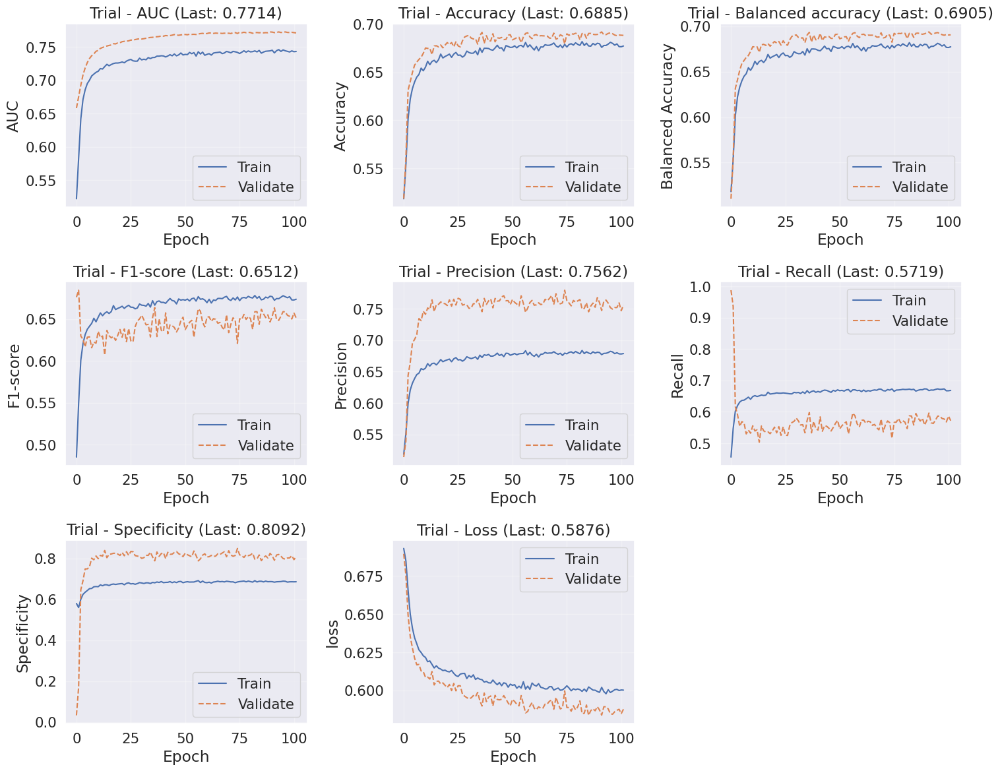

Training Progress:  10%|██████▏                                                      | 102/1000 [05:12<45:53,  3.07s/it]


   [Save] CNN Checkpoint Saved:
     - Model : /mnt/c/DataScience/Publication/Easygoing_Enter/Paper 3_IPV Prediction/Model/best_model_CNN_20260125_070407.keras
     - Params: /mnt/c/DataScience/Publication/Easygoing_Enter/Paper 3_IPV Prediction/Model/best_params_CNN_20260125_070407.json
999/999 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Performance: 


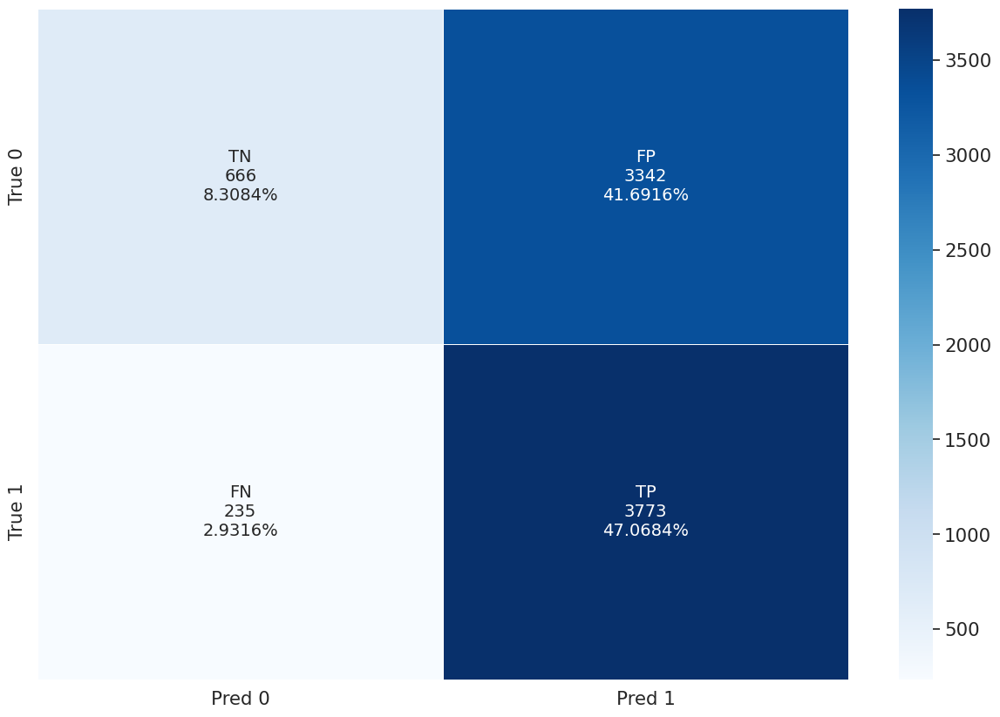

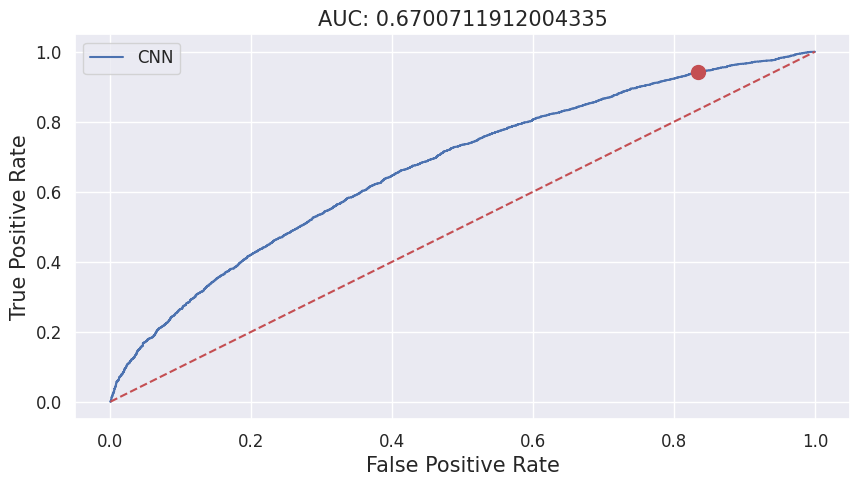

200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

   Modeling Completed. Summary of Performance (classification)


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,MLP,Train set,31940,11861,12693,3277,4109,0.783525,0.742705,0.794803,0.762569,0.768754,0.768754,0.850550
4,CNN,Train set,31940,15022,2673,13297,948,0.530457,0.940639,0.167376,0.678363,0.554008,0.554008,0.671851


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
1,MLP,Validation(CV),6388,2280,2342,797,969,0.740981,0.701754,0.746097,0.720835,0.723544,0.723926,0.800430
5,CNN,Validation(CV),6388,3043,537,2602,206,0.539061,0.936596,0.171074,0.684282,0.560426,0.553835,0.675270


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
2,MLP,Test set,8016,2744,3096,912,1264,0.750547,0.684631,0.772455,0.716075,0.728543,0.728543,0.800659
6,CNN,Test set,8016,3773,666,3342,235,0.530288,0.941367,0.166168,0.678414,0.553767,0.553767,0.669790


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
3,MLP,Entire population,39956,14605,15789,4189,5373,0.777110,0.731054,0.790319,0.753379,0.760687,0.760687,0.840639
7,CNN,Entire population,39956,18795,3339,16639,1183,0.530423,0.940785,0.167134,0.678373,0.553959,0.553959,0.671438


Saved total performance to: /mnt/c/DataScience/Publication/Easygoing_Enter/Paper 3_IPV Prediction/Result/Performance_DL(Trial10).csv
Saved total parameters to: /mnt/c/DataScience/Publication/Easygoing_Enter/Paper 3_IPV Prediction/Result/Hyperparams_DL(Trial10).csv
Saved total results object to: /mnt/c/DataScience/Publication/Easygoing_Enter/Paper 3_IPV Prediction/Model/Best_Result_DL(Trial10).pkl


In [14]:
# Setting
algorithm_list = ['MLP', 'CNN']
# TUNE_TRIALS = None
TUNE_TRIALS = 10

# DL 실행
results_DL, scores_DL = modeling_DL(
    algos=algorithm_list,
    X_train=X_train, Y_train=Y_train, X_test=X_test, Y_test=Y_test,
    node_list=None, # 특정 알고리즘
    validation_split=VALIDATION_SPLIT,
    validation_data=VALIDATION_DATA,
    tune_trials=TUNE_TRIALS, # 최적화 여부
    tune_metric=TUNE_METRIC_DL,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    earlystop_patient=None,
    shap_display=False,
    label_list=LABEL_LIST,
    random_state=RANDOM_STATE,
)

# Performance Summary

In [14]:
# Algorithms Loaded
algo_names = ['Logistic Regression', 'Random Forest', 'XGBoost', 'LightGBM', 'CatBoost', 'MLP', 'CNN']

# Result Summary
folder_location = os.path.join(os.getcwd(),'Result')
scores = prediction_summary(
    folder_location=folder_location, 
    algonames=algo_names,
    save_name=SAVE_NAME_PERFORMANCE,
)

### Performance Summary : 7 Algorithms ###

>>> [Train set] Performance Comparison


,Algorithm,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Logistic Regression,31940,10954,12149,3821,5016,0.7414,0.6859,0.7607,0.7126,0.7233,0.7233,0.7996
1,Random Forest,31940,15910,15970,0,60,1.0000,0.9962,1.0000,0.9981,0.9981,0.9981,1.0000
2,XGBoost,31940,15963,13569,2401,7,0.8693,0.9996,0.8497,0.9299,0.9246,0.9246,0.9968
3,LightGBM,31940,15744,15833,137,226,0.9914,0.9858,0.9914,0.9886,0.9886,0.9886,0.9993
4,CatBoost,31940,14747,14876,1094,1223,0.9309,0.9234,0.9315,0.9272,0.9275,0.9275,0.9799
5,MLP,31940,11861,12693,3277,4109,0.7835,0.7427,0.7948,0.7626,0.7688,0.7688,0.8505
6,CNN,31940,15022,2673,13297,948,0.5305,0.9406,0.1674,0.6784,0.5540,0.5540,0.6719



>>> [Validation(CV)] Performance Comparison


,Algorithm,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Logistic Regression,31940,10841,12004,3966,5129,0.7322,0.6785,0.7518,0.7043,0.7152,0.7152,0.7899
1,Random Forest,31940,12264,12320,3650,3706,0.7719,0.7688,0.7728,0.7704,0.7708,0.7708,0.8503
2,XGBoost,31940,14149,9537,6433,1821,0.6874,0.8855,0.5973,0.7740,0.7414,0.7414,0.8450
3,LightGBM,31940,12391,12383,3587,3579,0.7758,0.7731,0.7766,0.7744,0.7748,0.7748,0.8544
4,CatBoost,31940,12163,12309,3661,3807,0.7736,0.7687,0.7751,0.7711,0.7719,0.7719,0.8506
5,MLP,6388,2280,2342,797,969,0.7410,0.7018,0.7461,0.7208,0.7235,0.7239,0.8004
6,CNN,6388,3043,537,2602,206,0.5391,0.9366,0.1711,0.6843,0.5604,0.5538,0.6753



>>> [Test set] Performance Comparison


,Algorithm,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Logistic Regression,8016,2678,3090,918,1330,0.7447,0.6682,0.7710,0.7044,0.7196,0.7196,0.7915
1,Random Forest,8016,3090,3188,820,918,0.7903,0.7710,0.7954,0.7805,0.7832,0.7832,0.8617
2,XGBoost,8016,3648,2408,1600,360,0.6951,0.9102,0.6008,0.7882,0.7555,0.7555,0.8595
3,LightGBM,8016,3141,3215,793,867,0.7984,0.7837,0.8021,0.7910,0.7929,0.7929,0.8687
4,CatBoost,8016,3054,3173,835,954,0.7853,0.7620,0.7917,0.7735,0.7768,0.7768,0.8547
5,MLP,8016,2744,3096,912,1264,0.7505,0.6846,0.7725,0.7161,0.7285,0.7285,0.8007
6,CNN,8016,3773,666,3342,235,0.5303,0.9414,0.1662,0.6784,0.5538,0.5538,0.6698



>>> [Entire population] Performance Comparison


,Algorithm,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Logistic Regression,39956,13632,15239,4739,6346,0.7420,0.6824,0.7628,0.7109,0.7226,0.7226,0.7980
1,Random Forest,39956,19000,19158,820,978,0.9586,0.9510,0.9590,0.9548,0.9550,0.9550,0.9925
2,XGBoost,39956,19611,15977,4001,367,0.8306,0.9816,0.7997,0.8998,0.8907,0.8907,0.9770
3,LightGBM,39956,18885,19048,930,1093,0.9531,0.9453,0.9534,0.9492,0.9494,0.9494,0.9824
4,CatBoost,39956,17801,18049,1929,2177,0.9022,0.8910,0.9034,0.8966,0.8972,0.8972,0.9587
5,MLP,39956,14605,15789,4189,5373,0.7771,0.7311,0.7903,0.7534,0.7607,0.7607,0.8406
6,CNN,39956,18795,3339,16639,1183,0.5304,0.9408,0.1671,0.6784,0.5540,0.5540,0.6714


# Best Model Prediction

▶ Searching Directory: /mnt/c/DataScience/Publication/Easygoing_Enter/Paper 3_IPV Prediction/Model
Loading Model: LightGBM
   - File: best_model_LightGBM_20260126_144011.pkl
   - Successfully Loaded.
Performance: 


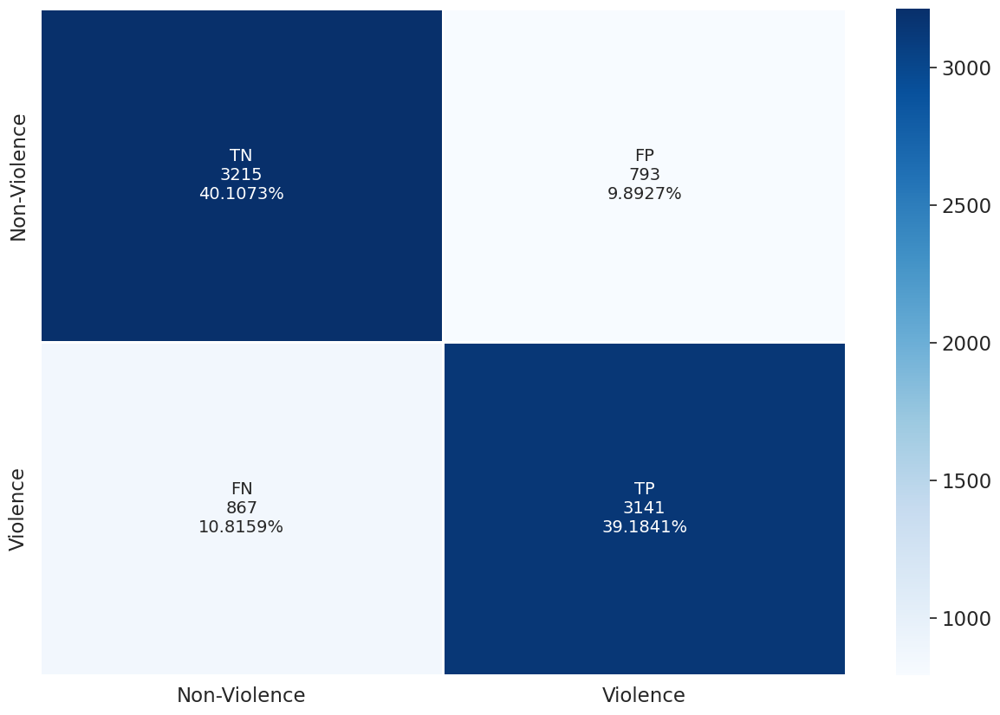

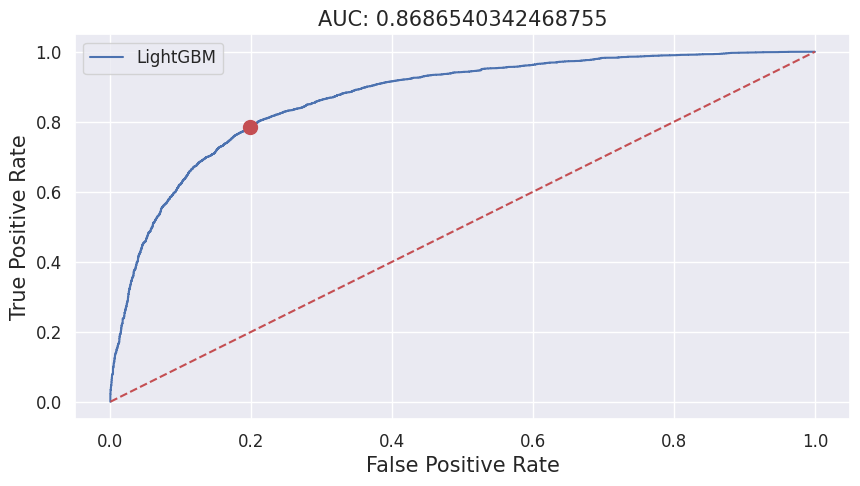

,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,LightGBM,Train set,31940,15744,15833,137,226,0.9914,0.9858,0.9914,0.9886,0.9886,0.9886,0.9993
1,LightGBM,Test set,8016,3141,3215,793,867,0.7984,0.7837,0.8021,0.7910,0.7929,0.7929,0.8687
2,LightGBM,Entire population,39956,18885,19048,930,1093,0.9531,0.9453,0.9534,0.9492,0.9494,0.9494,0.9824


In [15]:
# Model Loaded
best_scoreidx = np.argmax(scores[scores.Dataset=='Validation(CV)'][METRIC_FINAL])
best_algo = scores[scores.Dataset=='Validation(CV)'].iloc[best_scoreidx]['Algorithm']
# best_algo = 'XGBoost'
best_model, best_params = Loading_ModelBestParams(algo_name=best_algo)

# Performance Evaluation
Scores_Test = prediction_class(best_model, X_train, Y_train, X_test, Y_test,
                             LABEL_LIST=LABEL_LIST, ALGO_NAME=best_algo, keras=False)
display(Scores_Test)

In [ ]:
# # 실제 샘플 적용
# ## 한글만 가능 + 영어는 변수명재작성
# ## df_prep, X_colname
# user_info = {
#     '가구원수': 1,
#     '가구형태': 1,
#     '성별': 1,
#     '태어난 연도': 2002,
#     '교육수준1': 2,
#     '교육수준2': 0,
#     '장애종류': 0,
#     '혼인상태': 1,
#     # '동거여부': 1,
#     # '건강상태': 1,
#     # '1년간 의료기관 이용 외래진료횟수': 2,
#     # '입원횟수': 0,
#     # '만성질환': 1,
#     # '민간의료보험 가입건수': 1,
#     # '근로 능력 정도': 1,
#     # '주된 경제활동 참여상태': 1,
#     # '개인연금 가입여부': 1,
#     # '건강보험 가입여부': 1,
#     # '이사경험 여부': 1,
#     # '주택유형': 1,
#     # '주거위치': 1,
#     # '방수': 4,
#     # '집의  점유형태': 1,
#     # '교통비': 2,
#     # '통신비': 10,
#     # '기타소비-경조비': 5,
#     # '총생활비': 200,
# }

# print("Similar Samples...")
# result_pattern = samples_PatternMatching(df_prep, user_info, top_n=3)
# display(result_pattern[list(user_info.keys()) + ['similarity']])

# print("Probability Prediction:")
# best_model.predict_proba(df_prep.loc[[result_pattern.index[0]],[col for col in df_prep.columns if col != Y_colname]])[0,1]

# Explanation

In [16]:
if platform.system() == 'Darwin': #맥
    plt.rc('font', family='AppleGothic') 
elif platform.system() == 'Windows': #윈도우
    # FONT_NAME = 'Malgun Gothic'
    FONT_NAME = 'malgun'
    plt.rc('font', family=FONT_NAME) 
    plt.rcParams['font.family'] = FONT_NAME
    mpl.rc('font', family=FONT_NAME)
    sns.set(font=FONT_NAME) 
    sys_font = font_manager.findSystemFonts()
    FONT_PATHS = [path for path in sys_font if 'malgun' in path]
    if len(FONT_PATHS) != 0:
        rc('font', family=font_manager.FontProperties(fname=FONT_PATHS[0]).get_name())
elif platform.system() == 'Linux':
    FONT_NAME = 'NanumGothic'
    plt.rc('font', family=FONT_NAME) 
    plt.rcParams['font.family'] = FONT_NAME
    mpl.rc('font', family=FONT_NAME)
    sns.set(font=FONT_NAME) 
    sys_font = font_manager.findSystemFonts()
    FONT_PATHS = [path for path in sys_font if 'NanumGothic.ttf' in path]
    if len(FONT_PATHS) != 0:
        rc('font', family=font_manager.FontProperties(fname=FONT_PATHS[0]).get_name())

▶ Detected Task Type: [ classification ] (Target: binary)

   Running Machine Learning Algorithm: LightGBM (classification)
Explanations...:  2026-01-26 19:22:07.136974
Loading existing SHAP values: ./Model/shap_values_LightGBM_20260113_103528.pkl
Train Dataset: 2026-01-26 19:22:08.336083
Individual Explanation(1 Decision Plot -> 1 Force Plot -> 1000 Force Plot)...
Visualizing random index: 13927


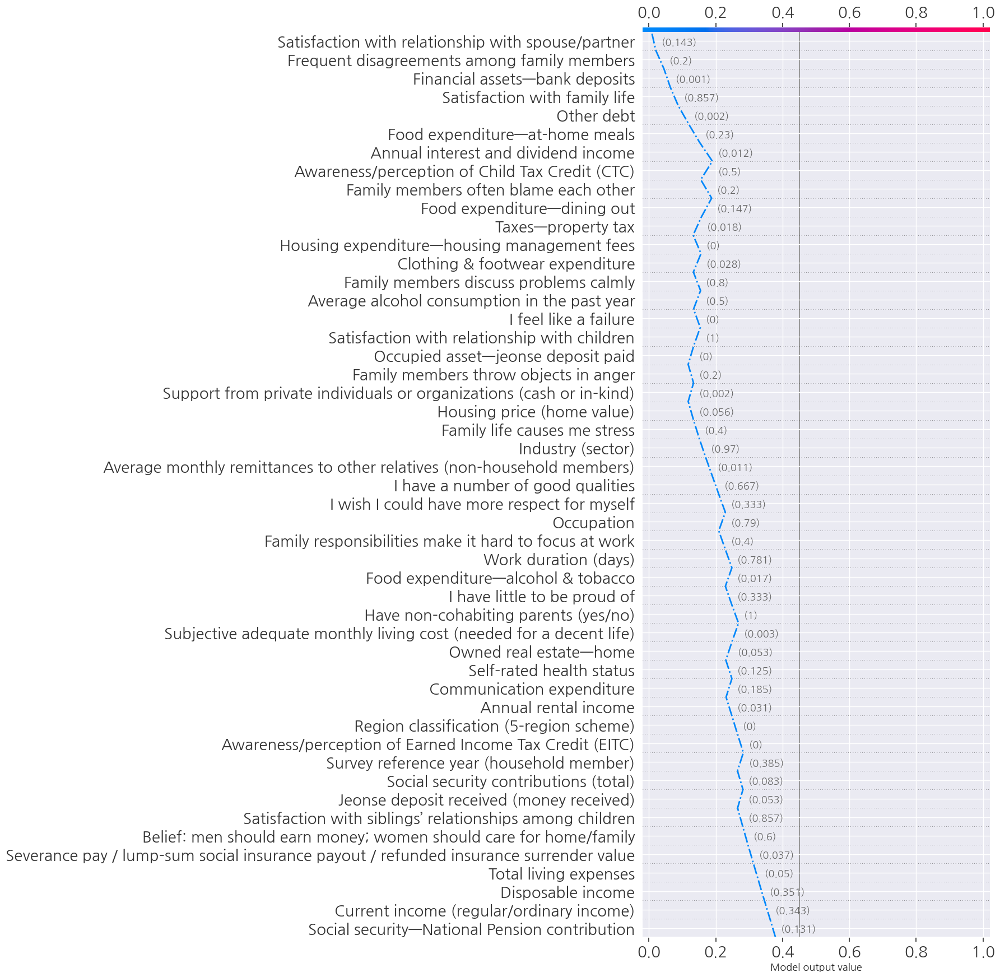

Test Dataset: 2026-01-26 19:22:08.803242
Individual Explanation(1 Decision Plot -> 1 Force Plot -> 1000 Force Plot)...
Visualizing random index: 1362


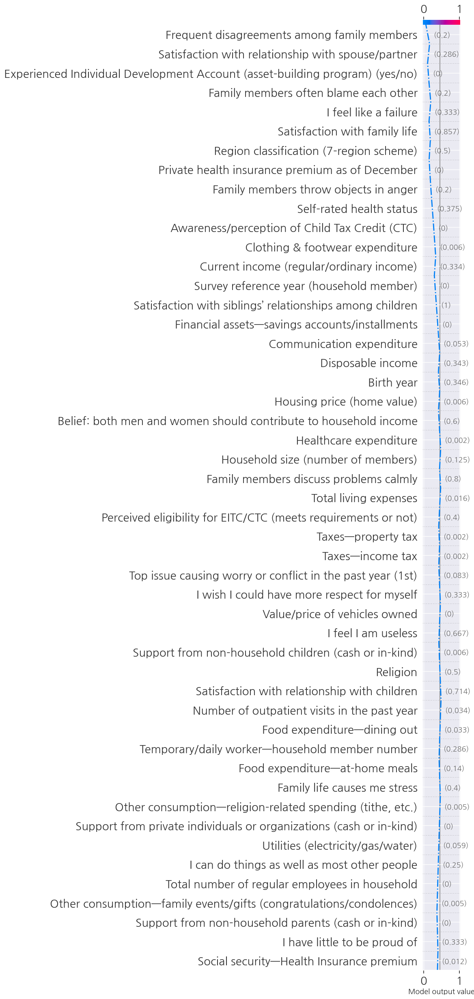

Train Dataset: 2026-01-26 19:22:09.384488
Total Explanation (Beeswarm + Importance Bar)...


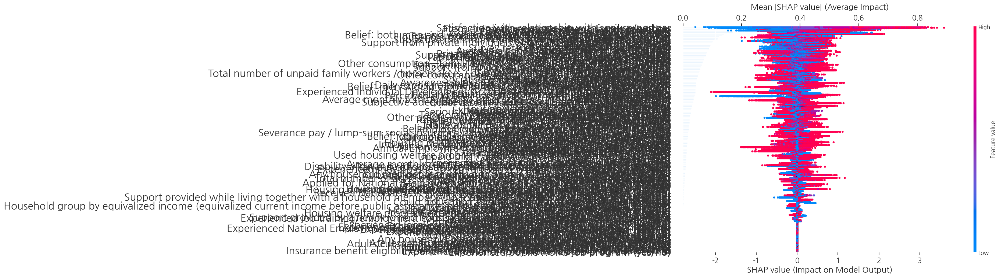

Test Dataset: 2026-01-26 19:23:11.724730
Total Explanation (Beeswarm + Importance Bar)...


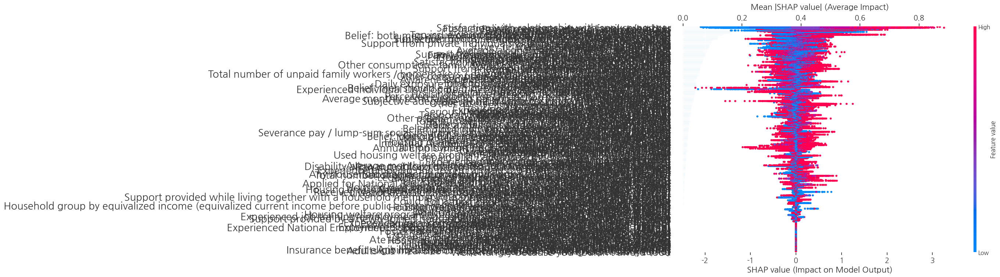

Train Dataset: 2026-01-26 19:23:30.567619
Feature Total Contribution...
Feature Contribution Direction...


100%|████████████████████████████████████████████████████████████████████████████████| 322/322 [00:03<00:00, 102.31it/s]


,Feature,Importance,Contribution Range,Contribution (Correlation),Contribution (Linear Regression),Contbituion (Quantile Regression),Direction (Correlation),Direction (Linear Regression),Direction (Quantile Regression),Feature,Importance,Contribution Range,Contribution (Correlation),Contribution (Linear Regression),Contbituion (Quantile Regression),Direction (Correlation),Direction (Linear Regression),Direction (Quantile Regression)
0,Satisfaction with relationship with spouse/partner,0.8487,1.7058,0.9015,4.4407,0.0343,+,+,+,Satisfaction with family life,0.3196,0.6668,-0.8717,-1.9784,0.0000,-,-,+
1,Frequent disagreements among family members,0.7969,1.6005,0.9244,5.1096,0.0000,+,+,+,Family members discuss problems calmly,0.1699,0.3672,-0.7584,-1.0090,0.0000,-,-,+
2,Family members often blame each other,0.3490,0.7303,0.9147,2.7046,0.0330,+,+,+,Self-rated health status,0.1692,0.4955,-0.6740,-1.5428,-1.5986,-,-,-
3,Family members throw objects in anger,0.2788,0.6741,0.9478,2.6684,0.0000,+,+,+,Life ladder score (subjective well-being),0.1334,0.2712,-0.8674,-0.3946,-0.2939,-,-,-
4,Birth year,0.2093,0.4205,0.9002,1.3683,1.8142,+,+,+,Region classification (7-region scheme),0.1212,0.2516,-0.4418,-0.2417,0.0029,-,-,+


,Feature,Importance,Contribution Range,Contribution (Correlation),Contribution (Linear Regression),Contbituion (Quantile Regression),Direction (Correlation),Direction (Linear Regression),Direction (Quantile Regression),Feature,Importance,Contribution Range,Contribution (Correlation),Contribution (Linear Regression),Contbituion (Quantile Regression),Direction (Correlation),Direction (Linear Regression),Direction (Quantile Regression)
0,Household type/structure,0.0375,1.1366,0.9652,1.3386,1.3386,+,+,+,Marital status,0.0415,1.2817,-0.9606,-1.2817,-1.2817,-,-,-
1,Family members throw objects in anger,0.2788,0.6741,0.9478,2.6684,0.0000,+,+,+,Housing facilities—water & sewerage use status,0.0002,NaN,-0.9260,-0.0788,-0.0788,-,-,-
2,Ran out of food due to financial hardship and couldn’t afford more,0.0087,0.3526,0.9290,0.6542,0.6542,+,+,+,Satisfaction with family life,0.3196,0.6668,-0.8717,-1.9784,0.0000,-,-,+
3,Frequent disagreements among family members,0.7969,1.6005,0.9244,5.1096,0.0000,+,+,+,Life ladder score (subjective well-being),0.1334,0.2712,-0.8674,-0.3946,-0.2939,-,-,-
4,Family members often blame each other,0.3490,0.7303,0.9147,2.7046,0.0330,+,+,+,Total number of regular employees in household,0.0436,0.0886,-0.8590,-0.2316,-0.0978,-,-,-


Test Dataset: 2026-01-26 19:23:33.922267
Feature Total Contribution...
Feature Contribution Direction...


100%|████████████████████████████████████████████████████████████████████████████████| 322/322 [00:02<00:00, 150.24it/s]


,Feature,Importance,Contribution Range,Contribution (Correlation),Contribution (Linear Regression),Contbituion (Quantile Regression),Direction (Correlation),Direction (Linear Regression),Direction (Quantile Regression),Feature,Importance,Contribution Range,Contribution (Correlation),Contribution (Linear Regression),Contbituion (Quantile Regression),Direction (Correlation),Direction (Linear Regression),Direction (Quantile Regression)
0,Satisfaction with relationship with spouse/partner,0.8422,1.6929,0.9056,4.4234,0.2886,+,+,+,Satisfaction with family life,0.3176,0.6649,-0.8842,-1.9946,-0.0416,-,-,-
1,Frequent disagreements among family members,0.7874,1.5931,0.9360,5.1055,-0.1752,+,+,-,Family members discuss problems calmly,0.1674,0.3643,-0.7702,-0.9990,0.0000,-,-,+
2,Family members often blame each other,0.3461,0.7224,0.9248,2.7134,0.2465,+,+,+,Self-rated health status,0.1665,0.4899,-0.6839,-1.5084,-1.6728,-,-,-
3,Family members throw objects in anger,0.2829,0.6860,0.9531,2.6870,0.0021,+,+,+,Life ladder score (subjective well-being),0.1328,0.2711,-0.8820,-0.3938,-0.2931,-,-,-
4,Birth year,0.2093,0.4203,0.9134,1.3665,1.7942,+,+,+,Region classification (7-region scheme),0.1161,0.2412,-0.4345,-0.2279,-0.0248,-,-,-


,Feature,Importance,Contribution Range,Contribution (Correlation),Contribution (Linear Regression),Contbituion (Quantile Regression),Direction (Correlation),Direction (Linear Regression),Direction (Quantile Regression),Feature,Importance,Contribution Range,Contribution (Correlation),Contribution (Linear Regression),Contbituion (Quantile Regression),Direction (Correlation),Direction (Linear Regression),Direction (Quantile Regression)
0,Experienced meal delivery service (yes/no),0.0007,NaN,0.9675,1.2164,1.2164,+,+,+,Marital status,0.0424,1.2523,-0.9605,-1.2523,-1.2523,-,-,-
1,Household type/structure,0.0420,1.1864,0.9648,1.3460,1.3460,+,+,+,Housing facilities—water & sewerage use status,0.0003,NaN,-0.9267,-0.0846,-0.0846,-,-,-
2,Family members throw objects in anger,0.2829,0.6860,0.9531,2.6870,0.0021,+,+,+,Satisfaction with family life,0.3176,0.6649,-0.8842,-1.9946,-0.0416,-,-,-
3,Experienced domestic help service (yes/no),0.0228,0.3565,0.9373,2.9161,2.9161,+,+,+,Life ladder score (subjective well-being),0.1328,0.2711,-0.8820,-0.3938,-0.2931,-,-,-
4,Frequent disagreements among family members,0.7874,1.5931,0.9360,5.1055,-0.1752,+,+,-,Total number of regular employees in household,0.0439,0.0891,-0.8634,-0.2346,-0.1112,-,-,-


Interaction SHAP Calculation...: 2026-01-26 19:23:36.136342
SHAP intervalues saved to /mnt/c/DataScience/Publication/Easygoing_Enter/Paper 3_IPV Prediction/Model/shap_intervalues_LightGBM_20260126_210707.pkl
Train Dataset Interaction: 2026-01-26 21:07:16.831005
Feature Interactive Contribution...


100%|████████████████████████████████████████████████████████████████████████████████| 322/322 [00:02<00:00, 127.10it/s]


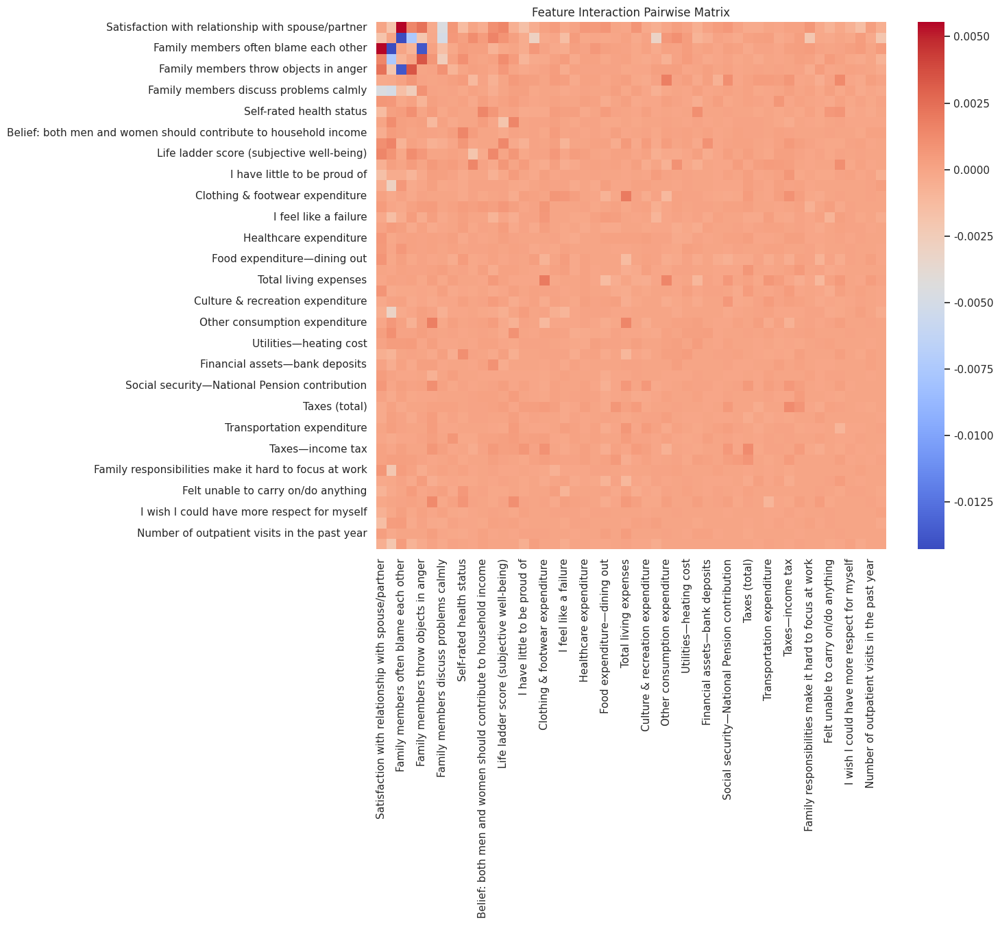

100%|████████████████████████████████████████████████████████████████████████████████| 322/322 [00:01<00:00, 260.35it/s]


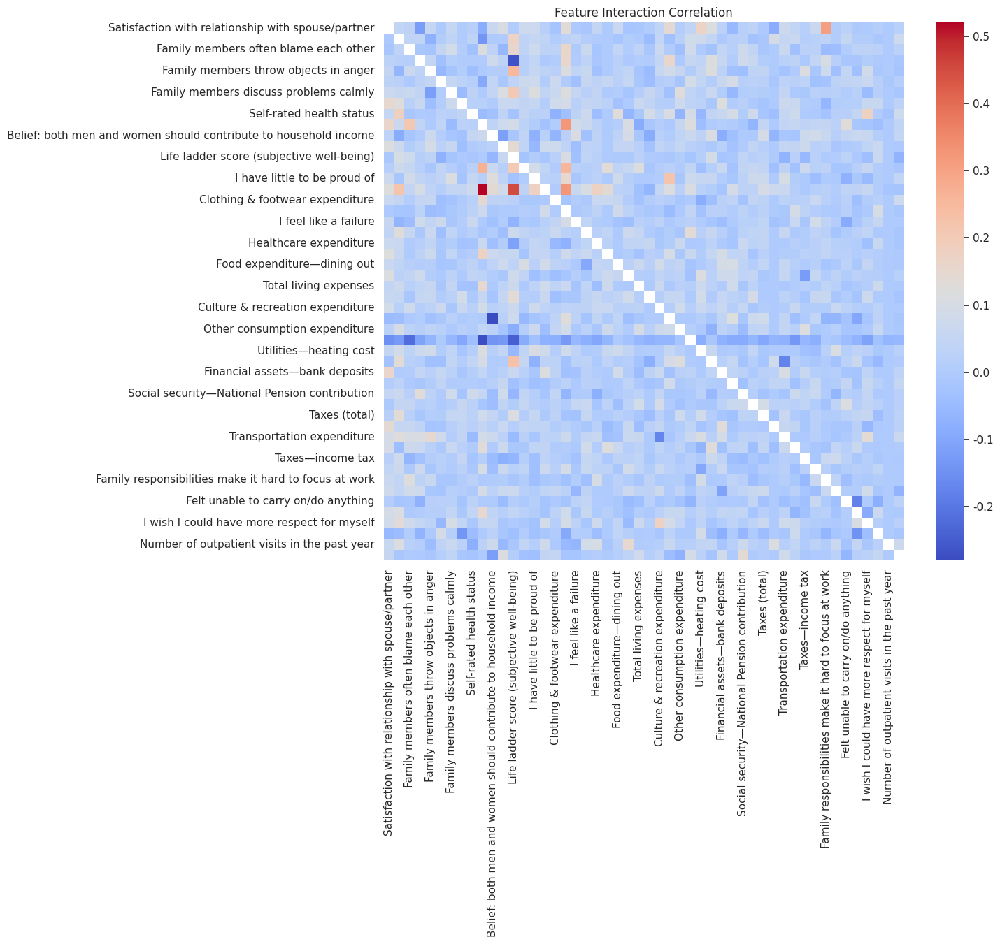

Test Dataset Interaction: 2026-01-26 21:07:25.551972
Feature Interactive Contribution...


100%|████████████████████████████████████████████████████████████████████████████████| 322/322 [00:02<00:00, 124.85it/s]


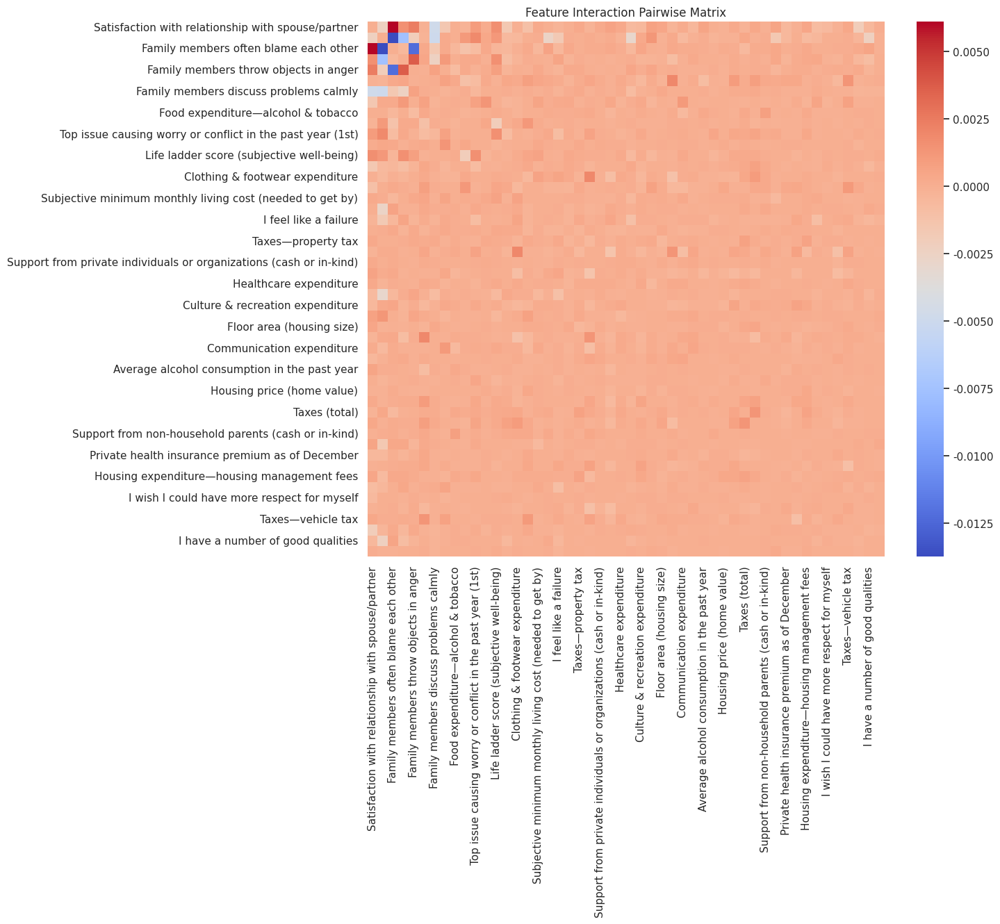

100%|████████████████████████████████████████████████████████████████████████████████| 322/322 [00:01<00:00, 282.57it/s]


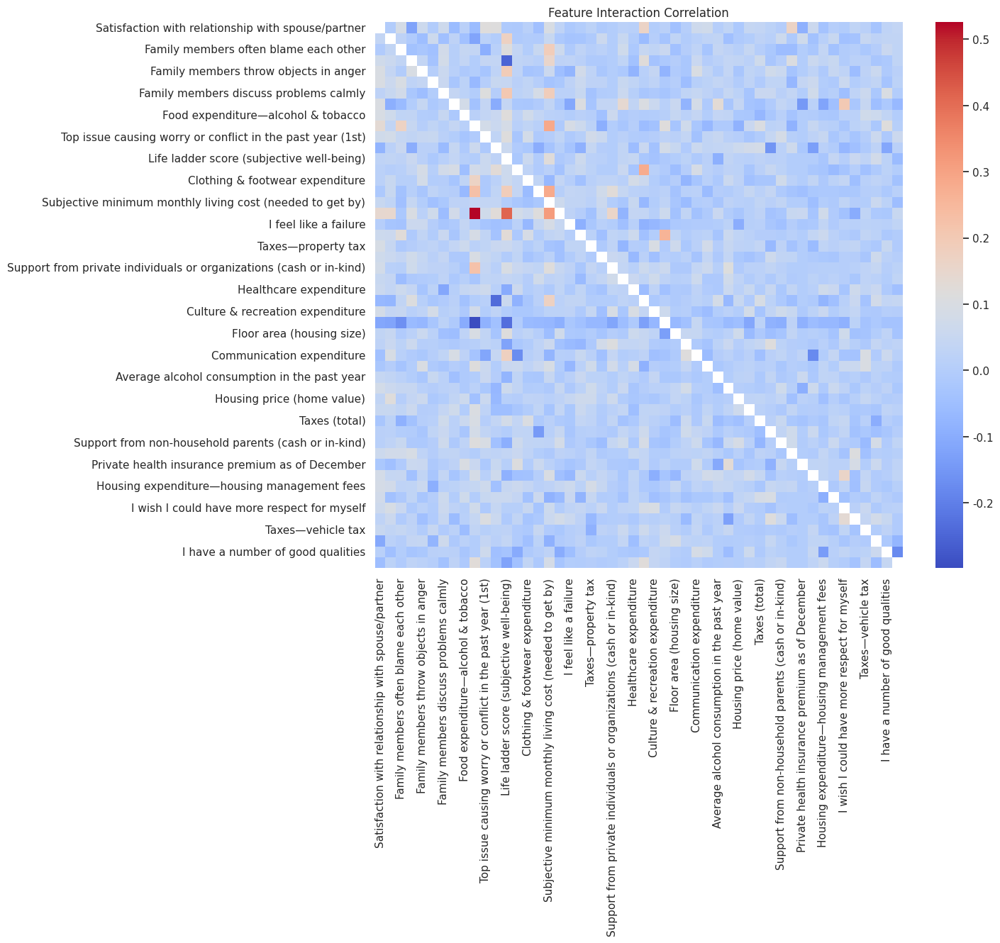

Performance Evaluations...:  2026-01-26 21:07:33.151653
Performance: 


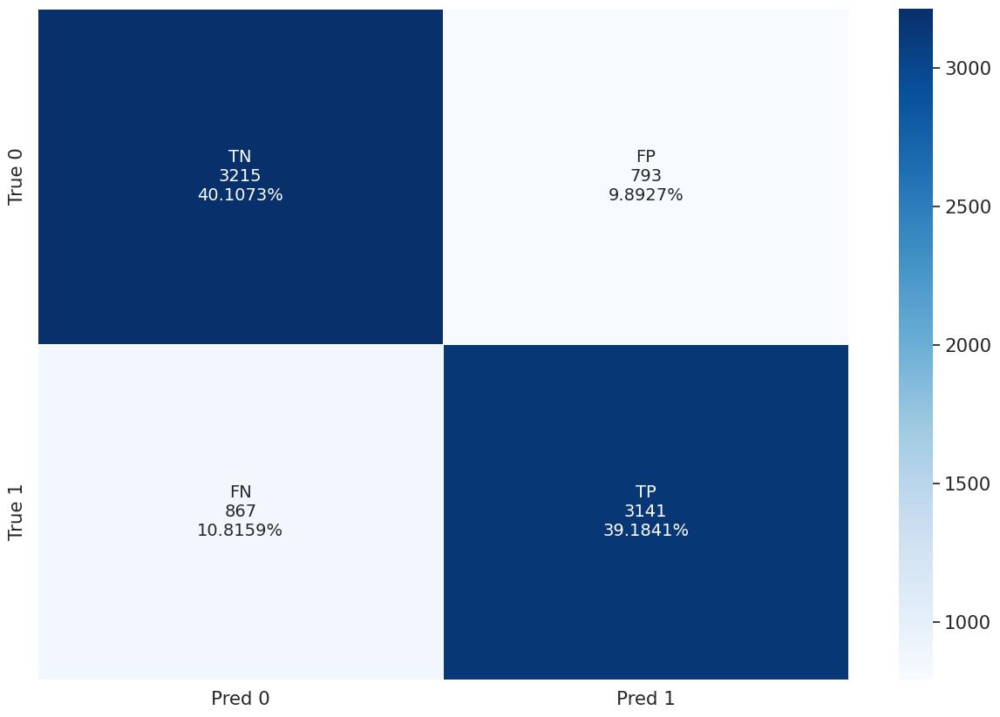

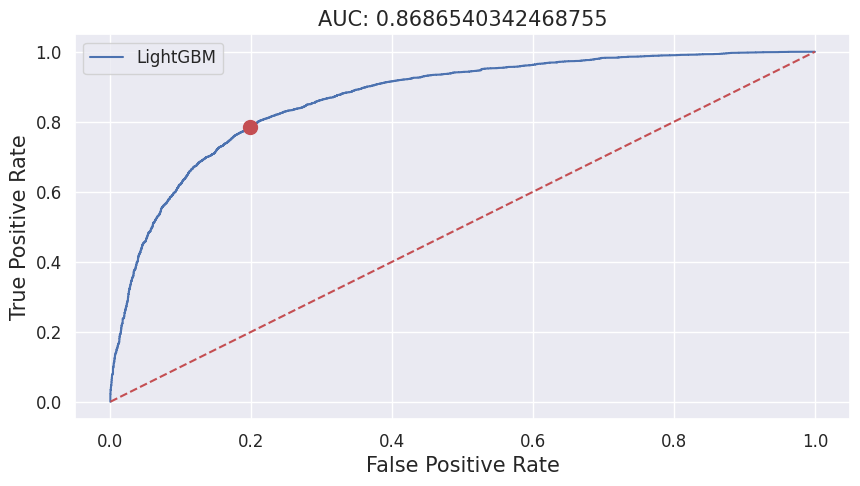

,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,LightGBM,Train set,31940,15744,15833,137,226,0.9914,0.9858,0.9914,0.9886,0.9886,0.9886,0.9993
1,LightGBM,Test set,8016,3141,3215,793,867,0.7984,0.7837,0.8021,0.7910,0.7929,0.7929,0.8687
2,LightGBM,Entire population,39956,18885,19048,930,1093,0.9531,0.9453,0.9534,0.9492,0.9494,0.9494,0.9824



   Modeling Completed. Summary of Performance (classification)


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,LightGBM,Train set,31940,15744,15833,137,226,0.991373,0.985848,0.991421,0.988603,0.988635,0.988635,0.999278


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
1,LightGBM,Test set,8016,3141,3215,793,867,0.798424,0.783683,0.802146,0.790985,0.792914,0.792914,0.868654


,Algorithm,Dataset,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
2,LightGBM,Entire population,39956,18885,19048,930,1093,0.953066,0.945290,0.953449,0.949162,0.949369,0.949369,0.982381


In [18]:
# Setting
algorithm_list = [best_algo]
params = best_params
TUNE_TRIALS = None
df_domain_rename = pd.read_excel(os.path.join(FOLDER_GDM, '[Rename_20251228].xlsx'), sheet_name='Features_SI')
df_domain_rename = {i[0]:i[1] for i in df_domain_rename[['변수설명(한글)', '변수설명(영어)']].values}
if LANGUAGE == 'kr':
    X_selected = [col for col in X_colname if col in list(df_domain_rename.keys())]
else:
    X_selected = [df_rename[col] for col in X_colname if col in list(df_domain_rename.keys())]

# ML 실행
results_SHAP, scores_SHAP = modeling_ML(
    algos=algorithm_list,
    X_train=X_train, Y_train=Y_train, X_test=X_test, Y_test=Y_test,
    X_colname=X_colname,
    params=params, # 특정 알고리즘
    tune_trials=TUNE_TRIALS, # 최적화 여부
    cv_splits=CV_SPLITS,
    tune_metric=TUNE_METRIC,
    shap=SHAP, 
    X_selected=X_selected, # shap에서만 작동
    interaction=INTERACTION,
    interaction_samples=INTERACTION_SAMPLES, 
    X_top_display=X_TOP_DISPLAY, 
    label_list=LABEL_LIST,
)